# Crop Deceases and Pest Identify 

## Configuration and Setup

In [1]:
# CONFIG — Edit these paths before running
import os
import warnings
warnings.filterwarnings('ignore')

# UPDATE THESE PATHS TO YOUR DATASET LOCATION 
DATA_DIR = r"C:\Users\shaky\Downloads\AA Research\AA Research\Crop_Decease_Pests"  
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")
OUTPUT_DIR = "./training_output"

# Optimized parameters for higher accuracy
IMG_SIZE = 224  # Standard size for EfficientNet models
BATCH_SIZE = 32  # Increased for better GPU utilization
EPOCHS = 30  # Base training epochs
FINE_TUNE_EPOCHS = 15  # Fine-tuning epochs
SEED = 42  # For reproducibility
LEARNING_RATE = 0.001  # Initial learning rate

# Output paths
SAVE_MODEL_PATH = os.path.join(OUTPUT_DIR, "plant_disease_model")
CATEGORIES_JSON = os.path.join(OUTPUT_DIR, "categories.json")
HISTORY_CSV = os.path.join(OUTPUT_DIR, "training_history.csv")

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(" CONFIG set. Paths:")
print(f"   Train: {TRAIN_DIR}")
print(f"   Test: {TEST_DIR}")
print(f"   Output: {OUTPUT_DIR}")
print(f"   Image Size: {IMG_SIZE}x{IMG_SIZE}")
print(f"   Batch Size: {BATCH_SIZE}")
print(f"   Training Epochs: {EPOCHS}")
print(f"   Fine-tuning Epochs: {FINE_TUNE_EPOCHS}")

 CONFIG set. Paths:
   Train: C:\Users\shaky\Downloads\AA Research\AA Research\Crop_Decease_Pests\train
   Test: C:\Users\shaky\Downloads\AA Research\AA Research\Crop_Decease_Pests\test
   Output: ./training_output
   Image Size: 224x224
   Batch Size: 32
   Training Epochs: 30
   Fine-tuning Epochs: 15


## Import Required Libraries

In [2]:
# Import all required libraries with error handling
try:
    import tensorflow as tf
    print(f" TensorFlow version: {tf.__version__}")
except ImportError:
    print(" TensorFlow not found. Install with: pip install tensorflow")
    raise

try:
    from tensorflow import keras
    from tensorflow.keras import layers
    import numpy as np
    import matplotlib.pyplot as plt
    import pandas as pd
    import json
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
    import itertools
    from PIL import Image, UnidentifiedImageError
    from collections import Counter
    import shutil
    from pathlib import Path
    import logging
    import seaborn as sns
    from datetime import datetime
    import time
    
    print(" All libraries imported successfully!")
    print(f" NumPy version: {np.__version__}")
    print(f" Pandas version: {pd.__version__}")
    print(f" Matplotlib version: {plt.matplotlib.__version__}")
    print(f" Scikit-learn available")
    print(f" PIL/Pillow available")
    
except ImportError as e:
    print(f" Import error: {e}")
    print("Install missing packages with:")
    print("pip install tensorflow numpy pandas matplotlib scikit-learn pillow seaborn")
    raise

# Set style for better plots
plt.style.use('default')
sns.set_palette("husl")

 TensorFlow version: 2.19.0
 All libraries imported successfully!
 NumPy version: 2.1.3
 Pandas version: 2.3.1
 Matplotlib version: 3.10.5
 Scikit-learn available
 PIL/Pillow available


## GPU Configuration and System Check

In [3]:
# GPU Configuration and System Information
def setup_gpu():
    """Configure GPU settings and print system information"""
    print("=== SYSTEM CONFIGURATION ===")
    
    # Check GPU availability
    gpus = tf.config.list_physical_devices('GPU')
    print(f"GPUs found: {len(gpus)}")
    
    if gpus:
        try:
            for i, gpu in enumerate(gpus):
                tf.config.experimental.set_memory_growth(gpu, True)
                print(f" GPU {i}: {gpu.name}")
            print(" Enabled memory growth for GPUs")
            
            # Try mixed precision for better performance
            try:
                policy = tf.keras.mixed_precision.Policy('mixed_float16')
                tf.keras.mixed_precision.set_global_policy(policy)
                print(" Mixed precision enabled (faster training)")
            except:
                print(" Mixed precision not available")
                
        except Exception as e:
            print(f" Could not configure GPU: {e}")
    else:
        print(" No GPU found, using CPU (training will be slower)")
    
    # System information
    print(f" TensorFlow built with CUDA: {tf.test.is_built_with_cuda()}")
    print(f" Available devices: {[d.name for d in tf.config.list_logical_devices()]}")
    print("=" * 40)

# Run GPU setup
setup_gpu()

# Set random seeds for reproducibility
tf.random.set_seed(SEED)
np.random.seed(SEED)
print(f" Random seed set to {SEED} for reproducibility")

=== SYSTEM CONFIGURATION ===
GPUs found: 0
 No GPU found, using CPU (training will be slower)
 TensorFlow built with CUDA: False
 Available devices: ['/device:CPU:0']
 Random seed set to 42 for reproducibility


## Image Cleanup Function

In [4]:
# Enhanced Image Cleanup with Comprehensive Error Handling
import logging

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

def clean_corrupt_images(directory, backup_dir=None, min_size=(32, 32), verbose=True):
    """
    Remove corrupt images with comprehensive error handling
    
    Args:
        directory: Directory to scan for corrupt images
        backup_dir: Optional directory to move corrupt files instead of deleting
        min_size: Minimum acceptable image dimensions (width, height)
        verbose: Print detailed progress
    
    Returns:
        dict: Statistics about processed images
    """
    stats = {
        'total_files': 0,
        'image_files': 0,
        'corrupt_removed': 0,
        'size_violations': 0,
        'format_conversions': 0,
        'errors': []
    }
    
    if verbose:
        print(f" Scanning directory: {directory}")
    
    # Check if directory exists
    if not os.path.exists(directory):
        error_msg = f"Directory not found: {directory}"
        if verbose:
            print(f" {error_msg}")
        stats['errors'].append(error_msg)
        return stats
    
    # Create backup directory if specified
    if backup_dir:
        os.makedirs(backup_dir, exist_ok=True)
        if verbose:
            print(f" Backup directory: {backup_dir}")
    
    # Supported image extensions
    image_extensions = {'.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.tif', '.gif', '.webp'}
    
    # Walk through directory
    for root, dirs, files in os.walk(directory):
        for file in files:
            stats['total_files'] += 1
            file_path = os.path.join(root, file)
            file_ext = Path(file).suffix.lower()
            
            # Skip non-image files
            if file_ext not in image_extensions:
                continue
            
            stats['image_files'] += 1
            
            try:
                # First check: File size (empty files)
                if os.path.getsize(file_path) == 0:
                    raise ValueError("Empty file (0 bytes)")
                
                # Second check: PIL verification
                with Image.open(file_path) as img:
                    img.verify()
                
                # Third check: Re-open for additional validation
                with Image.open(file_path) as img:
                    img.load()
                    
                    # Check minimum dimensions
                    width, height = img.size
                    if width < min_size[0] or height < min_size[1]:
                        stats['size_violations'] += 1
                        raise ValueError(f"Image too small: {width}x{height} (minimum: {min_size[0]}x{min_size[1]})")
                    
                    # Check for problematic modes and convert if necessary
                    if img.mode in ('RGBA', 'P', 'LA', '1'):
                        if verbose:
                            print(f" Converting {img.mode} to RGB: {os.path.basename(file_path)}")
                        
                        # Create backup before conversion
                        if backup_dir:
                            backup_path = os.path.join(backup_dir, f"original_{file}")
                            shutil.copy2(file_path, backup_path)
                        
                        # Convert to RGB
                        rgb_img = img.convert('RGB')
                        
                        # Save with proper format
                        if file_ext == '.png':
                            # Convert PNG to JPEG to avoid transparency issues
                            new_path = file_path.rsplit('.', 1)[0] + '.jpg'
                            rgb_img.save(new_path, 'JPEG', quality=95)
                            if new_path != file_path:
                                os.remove(file_path)
                        else:
                            rgb_img.save(file_path, quality=95)
                        
                        stats['format_conversions'] += 1
                
                # Fourth check: TensorFlow compatibility
                try:
                    image_string = tf.io.read_file(file_path)
                    decoded = tf.image.decode_image(image_string, channels=3)
                    _ = decoded.shape  # Ensure it's properly decoded
                except Exception as tf_error:
                    raise ValueError(f"TensorFlow decode error: {str(tf_error)[:50]}")
                        
            except Exception as e:
                error_msg = f"Corrupt image: {os.path.basename(file_path)} - {str(e)[:100]}"
                if verbose:
                    print(f" {error_msg}")
                stats['errors'].append(error_msg)
                
                try:
                    if backup_dir:
                        backup_path = os.path.join(backup_dir, f"corrupt_{file}")
                        shutil.move(file_path, backup_path)
                        if verbose:
                            print(f" Moved to backup: {os.path.basename(backup_path)}")
                    else:
                        os.remove(file_path)
                        if verbose:
                            print(f" Deleted: {os.path.basename(file_path)}")
                    
                    stats['corrupt_removed'] += 1
                    
                except Exception as delete_error:
                    error_msg = f"Failed to remove {file_path}: {delete_error}"
                    if verbose:
                        print(f" {error_msg}")
                    stats['errors'].append(error_msg)
    
    return stats

def print_cleanup_stats(stats, dataset_name):
    """Print detailed statistics about the cleanup process"""
    print(f"\n CLEANUP STATISTICS FOR {dataset_name.upper()}:")
    print(f"   Total files processed: {stats['total_files']:,}")
    print(f"   Image files found: {stats['image_files']:,}")
    print(f"   Corrupt images removed: {stats['corrupt_removed']:,}")
    print(f"   Format conversions: {stats['format_conversions']:,}")
    print(f"   Size violations: {stats['size_violations']:,}")
    
    if stats['errors'] and len(stats['errors']) <= 3:
        print(f"   Errors encountered: {len(stats['errors'])}")
        for error in stats['errors'][:3]:
            print(f"     - {error}")

# Execute cleanup
print(" Starting enhanced image cleanup...")
print("=" * 60)

BACKUP_DIR = "./corrupt_images_backup"
os.makedirs(BACKUP_DIR, exist_ok=True)

print(" Cleaning training dataset...")
train_stats = clean_corrupt_images(
    TRAIN_DIR, 
    backup_dir=f"{BACKUP_DIR}/train",
    min_size=(32, 32)
)

print("\n Cleaning test dataset...")
test_stats = clean_corrupt_images(
    TEST_DIR, 
    backup_dir=f"{BACKUP_DIR}/test",
    min_size=(32, 32)
)

# Print results
print_cleanup_stats(train_stats, "Training")
print_cleanup_stats(test_stats, "Test")

# Overall summary
total_removed = train_stats['corrupt_removed'] + test_stats['corrupt_removed']
total_processed = train_stats['image_files'] + test_stats['image_files']
total_conversions = train_stats['format_conversions'] + test_stats['format_conversions']

print(f"\n OVERALL SUMMARY:")
print(f"   Total images processed: {total_processed:,}")
print(f"   Total corrupt images removed: {total_removed:,}")
print(f"   Total format conversions: {total_conversions:,}")
if total_processed > 0:
    print(f"   Success rate: {((total_processed - total_removed) / total_processed * 100):.2f}%")

if total_removed > 0:
    print(f"\n Cleanup completed! Dataset should now work without errors.")
    print(f" Corrupt files backed up to: {BACKUP_DIR}")
else:
    print(f"\n No corrupt images found! Dataset is clean.")

print("=" * 60)

 Starting enhanced image cleanup...
 Cleaning training dataset...
 Scanning directory: C:\Users\shaky\Downloads\AA Research\AA Research\Crop_Decease_Pests\train
 Backup directory: ./corrupt_images_backup/train

 Cleaning test dataset...
 Scanning directory: C:\Users\shaky\Downloads\AA Research\AA Research\Crop_Decease_Pests\test
 Backup directory: ./corrupt_images_backup/test

 CLEANUP STATISTICS FOR TRAINING:
   Total files processed: 20,885
   Image files found: 20,885
   Corrupt images removed: 0
   Format conversions: 0
   Size violations: 0

 CLEANUP STATISTICS FOR TEST:
   Total files processed: 5,824
   Image files found: 5,824
   Corrupt images removed: 0
   Format conversions: 0
   Size violations: 0

 OVERALL SUMMARY:
   Total images processed: 26,709
   Total corrupt images removed: 0
   Total format conversions: 0
   Success rate: 100.00%

 No corrupt images found! Dataset is clean.


## Load and Analyze Dataset

In [5]:
# Load datasets with proper error handling
def load_datasets():
    """Load training, validation, and test datasets"""
    print(" Loading datasets...")
    
    try:
        # Load training dataset with validation split
        train_ds = tf.keras.utils.image_dataset_from_directory(
            TRAIN_DIR,
            validation_split=0.2,
            subset="training",
            seed=SEED,
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH_SIZE
        )

        val_ds = tf.keras.utils.image_dataset_from_directory(
            TRAIN_DIR,
            validation_split=0.2,
            subset="validation", 
            seed=SEED,
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH_SIZE
        )

        test_ds = tf.keras.utils.image_dataset_from_directory(
            TEST_DIR,
            shuffle=False,
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH_SIZE
        )

        class_names = train_ds.class_names
        num_classes = len(class_names)
        
        print(f" Found {num_classes} classes:")
        for i, name in enumerate(class_names):
            print(f"   {i:2d}. {name}")

        # Save categories mapping
        categories_dict = {i: name for i, name in enumerate(class_names)}
        with open(CATEGORIES_JSON, 'w') as f:
            json.dump(categories_dict, f, indent=2)
        print(f" Categories saved to {CATEGORIES_JSON}")
        
        return train_ds, val_ds, test_ds, class_names, num_classes
        
    except Exception as e:
        print(f" Error loading datasets: {e}")
        print("Please check your data directory structure!")
        raise

# Load datasets
train_ds, val_ds, test_ds, class_names, num_classes = load_datasets()

# Count samples in each dataset
def count_dataset_samples(dataset):
    """Count total samples in a tf.data.Dataset"""
    count = 0
    for batch in dataset:
        count += batch[0].shape[0]
    return count

print("\n Counting samples...")
train_count = count_dataset_samples(train_ds)
val_count = count_dataset_samples(val_ds)
test_count = count_dataset_samples(test_ds)

print(f"\n DATASET STATISTICS:")
print(f"   Training samples: {train_count:,}")
print(f"   Validation samples: {val_count:,}")
print(f"   Test samples: {test_count:,}")
print(f"   Total samples: {train_count + val_count + test_count:,}")
print(f"   Number of classes: {num_classes}")
print(f"   Image size: {IMG_SIZE}x{IMG_SIZE}")
print(f"   Batch size: {BATCH_SIZE}")

 Loading datasets...
Found 20885 files belonging to 22 classes.
Using 16708 files for training.
Found 20885 files belonging to 22 classes.
Using 4177 files for validation.
Found 5824 files belonging to 22 classes.
 Found 22 classes:
    0. Cashew anthracnose
    1. Cashew gumosis
    2. Cashew healthy
    3. Cashew leaf miner
    4. Cashew red rust
    5. Cassava bacterial blight
    6. Cassava brown spot
    7. Cassava green mite
    8. Cassava healthy
    9. Cassava mosaic
   10. Maize fall armyworm
   11. Maize grasshoper
   12. Maize healthy
   13. Maize leaf beetle
   14. Maize leaf blight
   15. Maize leaf spot
   16. Maize streak virus
   17. Tomato healthy
   18. Tomato leaf blight
   19. Tomato leaf curl
   20. Tomato septoria leaf spot
   21. Tomato verticulium wilt
 Categories saved to ./training_output\categories.json

 Counting samples...

 DATASET STATISTICS:
   Training samples: 16,708
   Validation samples: 4,177
   Test samples: 5,824
   Total samples: 26,709
   Number

## Data Visualization and Analysis

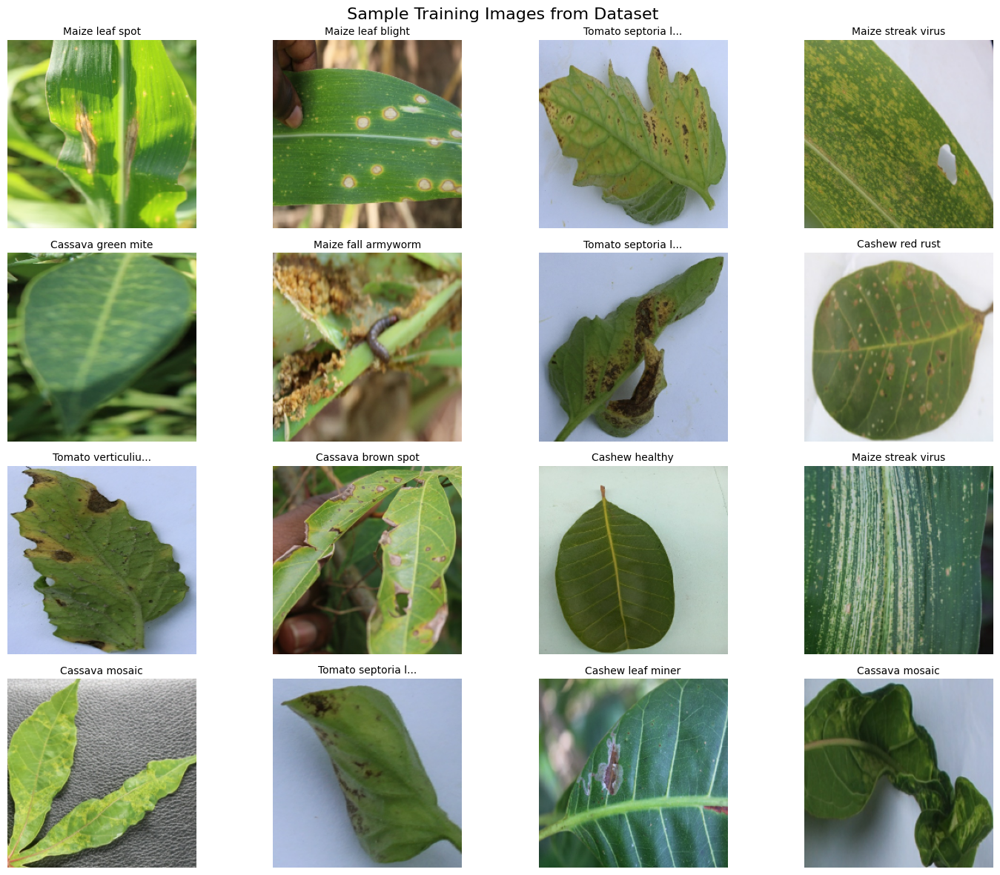

 Analyzing class distribution...

 CLASS DISTRIBUTION ANALYSIS:
   Total classes: 22
   Min samples per class: 145
   Max samples per class: 1,719
   Mean samples per class: 759.5
   Standard deviation: 402.7
   Imbalance ratio: 1:11.86


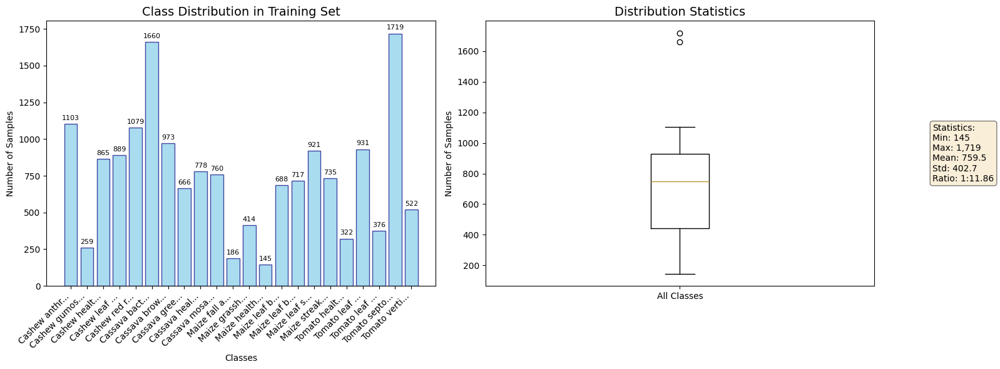


 DETAILED CLASS INFORMATION:
Class Name                Samples    Percentage  
--------------------------------------------------
Cashew anthracnose        1,103      6.60        %
Cashew gumosis            259        1.55        %
Cashew healthy            865        5.18        %
Cashew leaf miner         889        5.32        %
Cashew red rust           1,079      6.46        %
Cassava bacterial blight  1,660      9.94        %
Cassava brown spot        973        5.82        %
Cassava green mite        666        3.99        %
Cassava healthy           778        4.66        %
Cassava mosaic            760        4.55        %
Maize fall armyworm       186        1.11        %
Maize grasshoper          414        2.48        %
Maize healthy             145        0.87        %
Maize leaf beetle         688        4.12        %
Maize leaf blight         717        4.29        %
Maize leaf spot           921        5.51        %
Maize streak virus        735        4.40        %
To

In [6]:
# Comprehensive data visualization and analysis
def visualize_sample_images():
    """Display sample images from the training dataset"""
    plt.figure(figsize=(15, 12))
    
    for images, labels in train_ds.take(1):
        num_samples = min(16, images.shape[0])
        rows = 4
        cols = 4
        
        for i in range(num_samples):
            ax = plt.subplot(rows, cols, i + 1)
            img = images[i].numpy().astype('uint8')
            plt.imshow(img)
            
            class_name = class_names[labels[i]]
            # Truncate long class names for display
            display_name = class_name if len(class_name) <= 20 else class_name[:17] + "..."
            plt.title(display_name, fontsize=10, pad=5)
            plt.axis('off')
    
    plt.suptitle(' Sample Training Images from Dataset', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'sample_images.png'), dpi=150, bbox_inches='tight')
    plt.show()

def analyze_class_distribution():
    """Analyze and visualize class distribution"""
    print(" Analyzing class distribution...")
    
    # Count samples per class in training set
    labels = []
    for images, batch_labels in train_ds:
        labels.extend(batch_labels.numpy())
    
    counter = Counter(labels)
    
    # Calculate statistics
    counts = list(counter.values())
    class_stats = {
        'total_classes': len(counter),
        'min_samples': min(counts),
        'max_samples': max(counts),
        'mean_samples': np.mean(counts),
        'std_samples': np.std(counts),
        'imbalance_ratio': max(counts) / min(counts)
    }
    
    print(f"\n CLASS DISTRIBUTION ANALYSIS:")
    print(f"   Total classes: {class_stats['total_classes']}")
    print(f"   Min samples per class: {class_stats['min_samples']:,}")
    print(f"   Max samples per class: {class_stats['max_samples']:,}")
    print(f"   Mean samples per class: {class_stats['mean_samples']:.1f}")
    print(f"   Standard deviation: {class_stats['std_samples']:.1f}")
    print(f"   Imbalance ratio: 1:{class_stats['imbalance_ratio']:.2f}")
    
    # Visualize distribution
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Bar plot
    class_counts = [counter[i] for i in range(num_classes)]
    bars = ax1.bar(range(num_classes), class_counts, color='skyblue', edgecolor='navy', alpha=0.7)
    ax1.set_title('Class Distribution in Training Set', fontsize=14)
    ax1.set_xlabel('Classes')
    ax1.set_ylabel('Number of Samples')
    ax1.set_xticks(range(num_classes))
    
    # Truncate labels for x-axis
    truncated_names = [name[:12] + '...' if len(name) > 12 else name for name in class_names]
    ax1.set_xticklabels(truncated_names, rotation=45, ha='right')
    
    # Add value labels on bars
    for bar, count in zip(bars, class_counts):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(class_counts)*0.01, 
                str(count), ha='center', va='bottom', fontsize=8)
    
    # Box plot for distribution analysis
    ax2.boxplot(class_counts, vert=True)
    ax2.set_title('Distribution Statistics', fontsize=14)
    ax2.set_ylabel('Number of Samples')
    ax2.set_xticklabels(['All Classes'])
    
    # Add statistics text
    stats_text = f"""Statistics:
Min: {class_stats['min_samples']:,}
Max: {class_stats['max_samples']:,}
Mean: {class_stats['mean_samples']:.1f}
Std: {class_stats['std_samples']:.1f}
Ratio: 1:{class_stats['imbalance_ratio']:.2f}"""
    
    ax2.text(1.15, 0.5, stats_text, transform=ax2.transAxes, 
             verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'class_distribution.png'), dpi=150, bbox_inches='tight')
    plt.show()
    
    # Print detailed class information
    print(f"\n DETAILED CLASS INFORMATION:")
    print(f"{'Class Name':<25} {'Samples':<10} {'Percentage':<12}")
    print("-" * 50)
    
    total_samples = sum(class_counts)
    for i, name in enumerate(class_names):
        count = counter[i]
        percentage = (count / total_samples) * 100
        print(f"{name:<25} {count:<10,} {percentage:<12.2f}%")
    
    return counter, class_stats

# Execute visualizations
visualize_sample_images()
counter, class_stats = analyze_class_distribution()

## Data Pipeline Optimization and Augmentation

 Optimizing data pipeline...
 Data pipeline optimized!
 Data augmentation techniques applied:
   • Random horizontal flip
   • Random rotation (±20°)
   • Random zoom (±15%)
   • Random brightness (±10%)
   • Random contrast (±10%)
   • Random translation (±10%)
   • Random crop


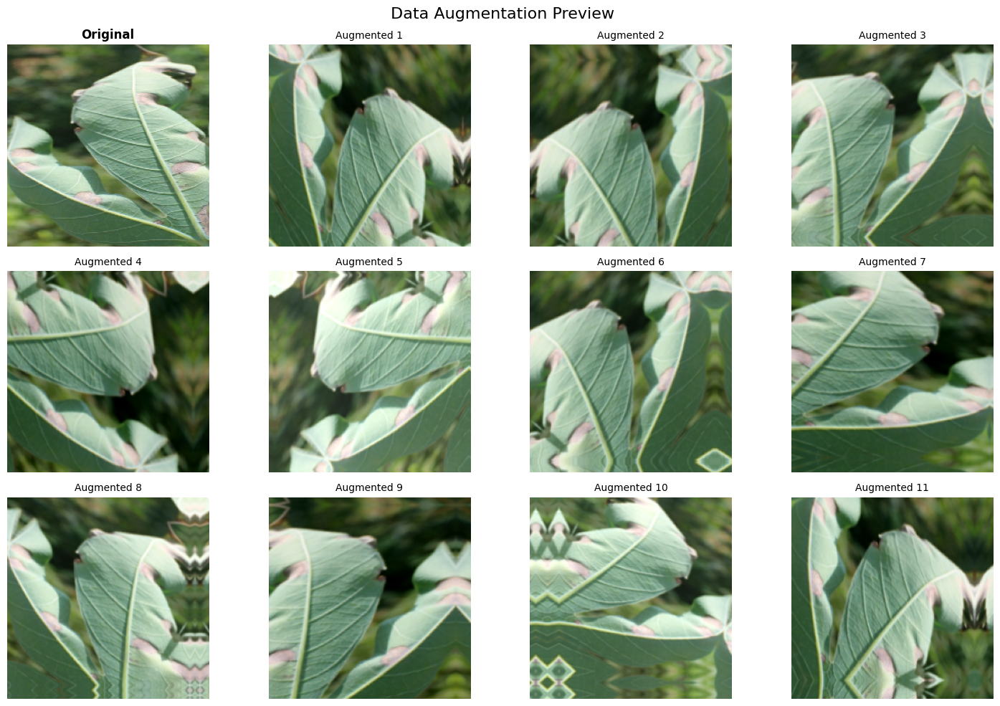

 Data pipeline setup complete!


In [7]:
# Data pipeline optimization and augmentation
print(" Optimizing data pipeline...")

# Performance optimization
AUTOTUNE = tf.data.AUTOTUNE

# Apply caching and prefetching for better performance
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Enhanced data augmentation for better generalization
data_augmentation = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.15),
    layers.RandomBrightness(0.1),
    layers.RandomContrast(0.1),
    layers.RandomTranslation(0.1, 0.1),
    # Additional augmentation for plant diseases
    layers.RandomCrop(IMG_SIZE, IMG_SIZE),
], name="data_augmentation")

print(" Data pipeline optimized!")
print(" Data augmentation techniques applied:")
print("   • Random horizontal flip")
print("   • Random rotation (±20°)")
print("   • Random zoom (±15%)")
print("   • Random brightness (±10%)")
print("   • Random contrast (±10%)")
print("   • Random translation (±10%)")
print("   • Random crop")

# Preview augmentation effects
def preview_augmentation():
    """Show original and augmented versions of images"""
    plt.figure(figsize=(15, 10))
    
    for images, labels in train_ds.take(1):
        # Select first image
        original_img = images[0:1]  # Keep batch dimension
        
        # Original
        plt.subplot(3, 4, 1)
        plt.imshow(original_img[0].numpy().astype('uint8'))
        plt.title('Original', fontsize=12, weight='bold')
        plt.axis('off')
        
        # Show 11 different augmentations
        for i in range(11):
            augmented = data_augmentation(original_img)
            plt.subplot(3, 4, i + 2)
            plt.imshow(augmented[0].numpy().astype('uint8'))
            plt.title(f'Augmented {i+1}', fontsize=10)
            plt.axis('off')
        break

    plt.suptitle(' Data Augmentation Preview', fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'augmentation_preview.png'), dpi=150, bbox_inches='tight')
    plt.show()

# Show augmentation preview
preview_augmentation()

print(" Data pipeline setup complete!")

## Calculate Class Weights for Imbalanced Dataset

 Calculating class weights for imbalanced dataset...

 CLASS WEIGHTS ANALYSIS:
Class Name                Samples    Weight     Effective Samples
-----------------------------------------------------------------
Cashew anthracnose        1,103      0.689      759.5          
Cashew gumosis            259        2.932      759.5          
Cashew healthy            865        0.878      759.5          
Cashew leaf miner         889        0.854      759.5          
Cashew red rust           1,079      0.704      759.5          
Cassava bacterial blight  1,660      0.458      759.5          
Cassava brown spot        973        0.781      759.5          
Cassava green mite        666        1.140      759.5          
Cassava healthy           778        0.976      759.5          
Cassava mosaic            760        0.999      759.5          
Maize fall armyworm       186        4.083      759.5          
Maize grasshoper          414        1.834      759.5          
Maize healthy        

<Figure size 1400x800 with 0 Axes>

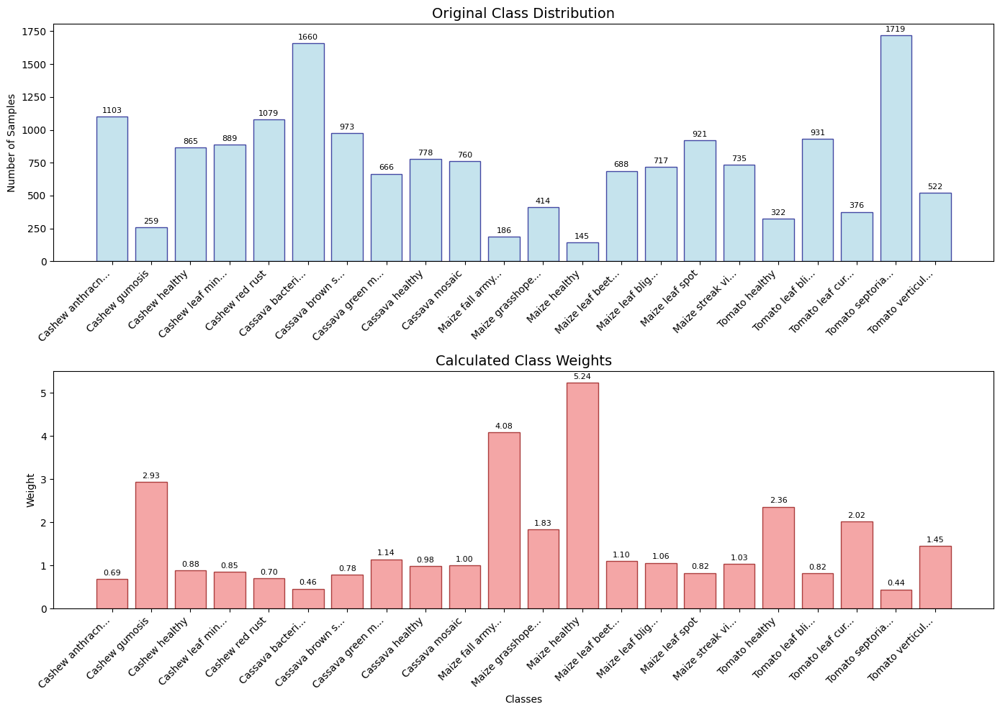


 BALANCE EFFECTIVENESS:
   Original imbalance ratio: 1:11.86
   After weighting ratio: 1:1.00
   Balance improvement: 91.6%
 Class weights calculated successfully!


In [8]:
# Calculate class weights to handle imbalanced dataset
def calculate_class_weights(counter, method='balanced'):
    """
    Calculate class weights for handling imbalanced datasets
    
    Args:
        counter: Counter object with class frequencies
        method: 'balanced' or 'inverse' weighting method
    
    Returns:
        dict: Class weights for training
    """
    print(" Calculating class weights for imbalanced dataset...")
    
    if method == 'balanced':
        # Scikit-learn style balanced weights
        n_samples = sum(counter.values())
        n_classes = len(counter)
        class_weights = {}
        
        for class_id in range(n_classes):
            class_weights[class_id] = n_samples / (n_classes * counter[class_id])
    
    elif method == 'inverse':
        # Inverse frequency weighting
        max_count = max(counter.values())
        class_weights = {cls: max_count / count for cls, count in counter.items()}
    
    else:
        raise ValueError("Method must be 'balanced' or 'inverse'")
    
    return class_weights

# Calculate weights
class_weights = calculate_class_weights(counter, method='balanced')

# Display class weights analysis
print(f"\n CLASS WEIGHTS ANALYSIS:")
print(f"{'Class Name':<25} {'Samples':<10} {'Weight':<10} {'Effective Samples':<15}")
print("-" * 65)

for i, name in enumerate(class_names):
    samples = counter[i]
    weight = class_weights[i]
    effective_samples = samples * weight
    print(f"{name:<25} {samples:<10,} {weight:<10.3f} {effective_samples:<15.1f}")

# Visualize class weights
plt.figure(figsize=(14, 8))

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

# Class counts
class_counts = [counter[i] for i in range(num_classes)]
truncated_names = [name[:15] + '...' if len(name) > 15 else name for name in class_names]

bars1 = ax1.bar(range(num_classes), class_counts, color='lightblue', alpha=0.7, edgecolor='navy')
ax1.set_title('Original Class Distribution', fontsize=14)
ax1.set_ylabel('Number of Samples')
ax1.set_xticks(range(num_classes))
ax1.set_xticklabels(truncated_names, rotation=45, ha='right')

# Add value labels
for bar, count in zip(bars1, class_counts):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(class_counts)*0.01, 
             str(count), ha='center', va='bottom', fontsize=8)

# Class weights
weights = [class_weights[i] for i in range(num_classes)]
bars2 = ax2.bar(range(num_classes), weights, color='lightcoral', alpha=0.7, edgecolor='darkred')
ax2.set_title('Calculated Class Weights', fontsize=14)
ax2.set_xlabel('Classes')
ax2.set_ylabel('Weight')
ax2.set_xticks(range(num_classes))
ax2.set_xticklabels(truncated_names, rotation=45, ha='right')

# Add value labels
for bar, weight in zip(bars2, weights):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(weights)*0.01, 
             f'{weight:.2f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'class_weights_analysis.png'), dpi=150, bbox_inches='tight')
plt.show()

# Calculate effective balance after weighting
print(f"\n BALANCE EFFECTIVENESS:")
max_effective = max([counter[i] * class_weights[i] for i in range(num_classes)])
min_effective = min([counter[i] * class_weights[i] for i in range(num_classes)])
new_ratio = max_effective / min_effective
original_ratio = max(counter.values()) / min(counter.values())

print(f"   Original imbalance ratio: 1:{original_ratio:.2f}")
print(f"   After weighting ratio: 1:{new_ratio:.2f}")
print(f"   Balance improvement: {((original_ratio - new_ratio) / original_ratio * 100):.1f}%")

print(" Class weights calculated successfully!")

## Build Enhanced Model Architecture

In [9]:
# Build enhanced model with multiple architecture options
def build_model(architecture='efficientnet', num_classes=num_classes, img_size=IMG_SIZE):
    """
    Build model with different architecture options
    
    Args:
        architecture: 'efficientnet', 'resnet', 'mobilenet', or 'vgg'
        num_classes: Number of output classes
        img_size: Input image size
    
    Returns:
        model: Compiled Keras model
        model_name: Name of the architecture used
        preprocessing_func: Preprocessing function for the architecture
    """
    print(f" Building model with {architecture} architecture...")
    
    IMG_SHAPE = (img_size, img_size, 3)
    
    # Try different architectures with fallback options
    if architecture == 'efficientnet':
        try:
            base_model = tf.keras.applications.EfficientNetV2S(
                include_top=False,
                weights='imagenet',
                input_shape=IMG_SHAPE
            )
            preprocessing_func = tf.keras.applications.efficientnet_v2.preprocess_input
            model_name = "EfficientNetV2-S"
            print(" Using EfficientNetV2-S backbone")
        except:
            try:
                base_model = tf.keras.applications.EfficientNetB3(
                    include_top=False,
                    weights='imagenet',
                    input_shape=IMG_SHAPE
                )
                preprocessing_func = tf.keras.applications.efficientnet.preprocess_input
                model_name = "EfficientNetB3"
                print(" Using EfficientNetB3 backbone (fallback)")
            except:
                # Final fallback to ResNet50
                base_model = tf.keras.applications.ResNet50(
                    include_top=False,
                    weights='imagenet',
                    input_shape=IMG_SHAPE
                )
                preprocessing_func = tf.keras.applications.resnet50.preprocess_input
                model_name = "ResNet50"
                print(" Using ResNet50 backbone (final fallback)")
    
    elif architecture == 'resnet':
        base_model = tf.keras.applications.ResNet152V2(
            include_top=False,
            weights='imagenet',
            input_shape=IMG_SHAPE
        )
        preprocessing_func = tf.keras.applications.resnet_v2.preprocess_input
        model_name = "ResNet152V2"
        print(" Using ResNet152V2 backbone")
    
    elif architecture == 'mobilenet':
        base_model = tf.keras.applications.MobileNetV3Large(
            include_top=False,
            weights='imagenet',
            input_shape=IMG_SHAPE
        )
        preprocessing_func = tf.keras.applications.mobilenet_v3.preprocess_input
        model_name = "MobileNetV3Large"
        print(" Using MobileNetV3Large backbone")
    
    elif architecture == 'vgg':
        base_model = tf.keras.applications.VGG19(
            include_top=False,
            weights='imagenet',
            input_shape=IMG_SHAPE
        )
        preprocessing_func = tf.keras.applications.vgg19.preprocess_input
        model_name = "VGG19"
        print(" Using VGG19 backbone")
    
    else:
        raise ValueError("Architecture must be 'efficientnet', 'resnet', 'mobilenet', or 'vgg'")
    
    # Freeze base model initially
    base_model.trainable = False
    
    # Build the complete model
    inputs = keras.Input(shape=IMG_SHAPE)
    x = data_augmentation(inputs)  # Apply augmentation
    x = preprocessing_func(x)  # Apply preprocessing
    x = base_model(x, training=False)  # Base model (frozen)
    
    # Enhanced classifier head
    x = layers.GlobalAveragePooling2D(name='global_avg_pooling')(x)
    x = layers.BatchNormalization(name='bn_1')(x)
    x = layers.Dropout(0.3, name='dropout_1')(x)
    
    # Dense layers with proper regularization
    x = layers.Dense(512, activation='relu', name='dense_1',
                     kernel_regularizer=keras.regularizers.l2(0.001))(x)
    x = layers.BatchNormalization(name='bn_2')(x)
    x = layers.Dropout(0.5, name='dropout_2')(x)
    
    x = layers.Dense(256, activation='relu', name='dense_2',
                     kernel_regularizer=keras.regularizers.l2(0.001))(x)
    x = layers.BatchNormalization(name='bn_3')(x)
    x = layers.Dropout(0.5, name='dropout_3')(x)
    
    # Output layer
    outputs = layers.Dense(num_classes, activation='softmax', 
                          dtype='float32', name='predictions')(x)
    
    # Create model
    model = keras.Model(inputs, outputs, name=f'{model_name}_PlantDisease')
    
    return model, model_name, preprocessing_func

# Build the model
model, model_name, preprocessing_func = build_model('efficientnet', num_classes, IMG_SIZE)

# Model information
trainable_params = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
non_trainable_params = sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])
total_params = trainable_params + non_trainable_params

print(f"\n MODEL ARCHITECTURE SUMMARY:")
print(f"   Architecture: {model_name}")
print(f"   Total parameters: {total_params:,}")
print(f"   Trainable parameters: {trainable_params:,}")
print(f"   Non-trainable parameters: {non_trainable_params:,}")
print(f"   Output classes: {num_classes}")
print(f"   Input shape: {model.input_shape}")
print(f"   Output shape: {model.output_shape}")

# Display model summary
print(f"\n DETAILED MODEL SUMMARY:")
model.summary()

# Save model architecture plot
try:
    tf.keras.utils.plot_model(
        model, 
        to_file=os.path.join(OUTPUT_DIR, 'model_architecture.png'),
        show_shapes=True,
        show_layer_names=True,
        rankdir='TB',
        dpi=150
    )
    print(f" Model architecture diagram saved to {OUTPUT_DIR}/model_architecture.png")
except Exception as e:
    print(f" Could not save model architecture diagram: {e}")

print(" Model built successfully!")

 Building model with efficientnet architecture...
82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 81s 1us/step
 Using EfficientNetV2-S backbone

 MODEL ARCHITECTURE SUMMARY:
   Architecture: EfficientNetV2-S
   Total parameters: 21,132,406
   Trainable parameters: 796,950
   Non-trainable parameters: 20,335,456
   Output classes: 22
   Input shape: (None, 224, 224, 3)
   Output shape: (None, 22)

 DETAILED MODEL SUMMARY:


Model: "EfficientNetV2-S_PlantDisease"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-s (Functional)        │ (None, 7, 7, 1280)          │      20,331,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_avg_pooling                   │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn_1 (BatchNormalization)            │ (None, 1280)                │           5,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn_2 (BatchNormalization)            │ (None, 512)                 │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bn_3 (BatchNormalization)            │ (None, 256)                 │           1,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ predictions (Dense)                  │ (None, 22)                  │           5,654 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,132,406 (80.61 MB)

 Trainable params: 796,950 (3.04 MB)

 Non-trainable params: 20,335,456 (77.57 MB)

You must install pydot (`pip install pydot`) for `plot_model` to work.
 Model architecture diagram saved to ./training_output/model_architecture.png
 Model built successfully!


## Model Compilation with Advanced Optimizers

In [10]:
# Advanced model compilation with multiple optimizer options
def compile_model_advanced(model, learning_rate=LEARNING_RATE, optimizer_type='adam'):
    """
    Compile model with advanced optimizers and metrics
    
    Args:
        model: Keras model to compile
        learning_rate: Initial learning rate
        optimizer_type: 'adam', 'adamw', 'sgd', or 'rmsprop'
    
    Returns:
        Compiled model
    """
    print(f" Compiling model with {optimizer_type} optimizer...")
    
    # Define custom metrics
    def top_3_accuracy(y_true, y_pred):
        return tf.keras.metrics.sparse_top_k_categorical_accuracy(y_true, y_pred, k=3)
    
    def top_5_accuracy(y_true, y_pred):
        return tf.keras.metrics.sparse_top_k_categorical_accuracy(y_true, y_pred, k=5)
    
    # Select optimizer
    if optimizer_type == 'adam':
        optimizer = keras.optimizers.Adam(
            learning_rate=learning_rate,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-7
        )
    elif optimizer_type == 'adamw':
        optimizer = keras.optimizers.AdamW(
            learning_rate=learning_rate,
            weight_decay=0.001,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-7
        )
    elif optimizer_type == 'sgd':
        optimizer = keras.optimizers.SGD(
            learning_rate=learning_rate,
            momentum=0.9,
            nesterov=True
        )
    elif optimizer_type == 'rmsprop':
        optimizer = keras.optimizers.RMSprop(
            learning_rate=learning_rate,
            rho=0.9,
            momentum=0.9
        )
    else:
        raise ValueError("optimizer_type must be 'adam', 'adamw', 'sgd', or 'rmsprop'")
    
    # Compile model
    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=[
            'accuracy',
            top_3_accuracy,
            top_5_accuracy
        ]
    )
    
    return model, optimizer_type

# Compile the model
model, optimizer_used = compile_model_advanced(model, LEARNING_RATE, 'adam')

print(f" Model compiled successfully!")
print(f"   Optimizer: {optimizer_used}")
print(f"   Learning rate: {LEARNING_RATE}")
print(f"   Loss function: sparse_categorical_crossentropy")
print(f"   Metrics: accuracy, top_3_accuracy, top_5_accuracy")

# Test model with a small batch
print(f"\n Testing model with sample batch...")
try:
    for test_batch in train_ds.take(1):
        test_images, test_labels = test_batch
        test_pred = model.predict(test_images[:4], verbose=0)  # Test with 4 images
        print(f" Model prediction test successful!")
        print(f"   Input shape: {test_images[:4].shape}")
        print(f"   Output shape: {test_pred.shape}")
        print(f"   Prediction probabilities sum: {test_pred[0].sum():.6f} (should be ~1.0)")
        break
except Exception as e:
    print(f" Model test failed: {e}")
    raise

print(" Model compilation and testing complete!")

 Compiling model with adam optimizer...
 Model compiled successfully!
   Optimizer: adam
   Learning rate: 0.001
   Loss function: sparse_categorical_crossentropy
   Metrics: accuracy, top_3_accuracy, top_5_accuracy

 Testing model with sample batch...
 Model prediction test successful!
   Input shape: (4, 224, 224, 3)
   Output shape: (4, 22)
   Prediction probabilities sum: 1.000000 (should be ~1.0)
 Model compilation and testing complete!


## Advanced Callbacks Setup

In [11]:
# Set up advanced callbacks for training
def setup_callbacks(model_save_path, history_csv_path):
    """
    Setup comprehensive callbacks for training monitoring and control
    
    Args:
        model_save_path: Path to save the best model
        history_csv_path: Path to save training history
    
    Returns:
        List of callbacks
    """
    print(" Setting up advanced training callbacks...")
    
    # Ensure save directories exist
    os.makedirs(os.path.dirname(model_save_path), exist_ok=True)
    os.makedirs(os.path.dirname(history_csv_path), exist_ok=True)
    
    callbacks = [
        # Model checkpointing - save best model
        keras.callbacks.ModelCheckpoint(
            filepath=os.path.join(model_save_path, "best_model.h5"),
            monitor='val_accuracy',
            mode='max',
            save_best_only=True,
            save_weights_only=False,
            verbose=1,
            save_freq='epoch'
        ),
        
        # Early stopping to prevent overfitting
        keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            verbose=1,
            restore_best_weights=True,
            min_delta=0.001,
            mode='min'
        ),
        
        # Reduce learning rate on plateau
        keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=5,
            verbose=1,
            mode='min',
            min_delta=0.001,
            cooldown=2,
            min_lr=1e-8
        ),
        
        # CSV Logger for detailed history
        keras.callbacks.CSVLogger(
            filename=history_csv_path,
            separator=',',
            append=False
        ),
        
        # Learning rate scheduler (cosine annealing)
        keras.callbacks.LearningRateScheduler(
            schedule=lambda epoch, lr: lr * 0.95 if epoch > 5 else lr,
            verbose=0
        ),
        
        # Custom callback for detailed monitoring
        keras.callbacks.LambdaCallback(
            on_epoch_end=lambda epoch, logs: print(
                f"Epoch {epoch+1:3d} - "
                f"loss: {logs.get('loss', 0):.4f} - "
                f"acc: {logs.get('accuracy', 0)*100:5.2f}% - "
                f"val_loss: {logs.get('val_loss', 0):.4f} - "
                f"val_acc: {logs.get('val_accuracy', 0)*100:5.2f}% - "
                f"lr: {logs.get('lr', 0):.2e}"
            )
        )
    ]
    
    # Add TensorBoard logging if available
    try:
        tensorboard_dir = os.path.join(OUTPUT_DIR, 'tensorboard_logs', 
                                     f'run_{datetime.now().strftime("%Y%m%d_%H%M%S")}')
        os.makedirs(tensorboard_dir, exist_ok=True)
        
        tensorboard_callback = keras.callbacks.TensorBoard(
            log_dir=tensorboard_dir,
            histogram_freq=1,
            write_graph=True,
            write_images=True,
            update_freq='epoch',
            profile_batch=0  # Disable profiling
        )
        callbacks.append(tensorboard_callback)
        print(f"    TensorBoard logging enabled: {tensorboard_dir}")
    except Exception as e:
        print(f"    TensorBoard logging disabled: {e}")
    
    return callbacks

# Setup callbacks
callbacks = setup_callbacks(SAVE_MODEL_PATH, HISTORY_CSV)

print(f" Callbacks configured successfully!")
print(f"    Model checkpointing enabled")
print(f"    Early stopping (patience=10)")
print(f"    Learning rate reduction (patience=5)")
print(f"    CSV logging enabled")
print(f"    Learning rate scheduling enabled")
print(f"    Custom monitoring enabled")

# Verify callback setup
print(f"\n CALLBACK VERIFICATION:")
for i, callback in enumerate(callbacks):
    callback_name = callback.__class__.__name__
    print(f"   {i+1:2d}. {callback_name}")

print(f"\n SAVE LOCATIONS:")
print(f"   Best model: {SAVE_MODEL_PATH}/best_model.h5")
print(f"   Training history: {HISTORY_CSV}")
print(f"   Output directory: {OUTPUT_DIR}")

print(" Callbacks setup complete!")

 Setting up advanced training callbacks...
    TensorBoard logging enabled: ./training_output\tensorboard_logs\run_20250812_103201
 Callbacks configured successfully!
    Model checkpointing enabled
    Early stopping (patience=10)
    Learning rate reduction (patience=5)
    CSV logging enabled
    Learning rate scheduling enabled
    Custom monitoring enabled

 CALLBACK VERIFICATION:
    1. ModelCheckpoint
    2. EarlyStopping
    3. ReduceLROnPlateau
    4. CSVLogger
    5. LearningRateScheduler
    6. LambdaCallback
    7. TensorBoard

 SAVE LOCATIONS:
   Best model: ./training_output\plant_disease_model/best_model.h5
   Training history: ./training_output\training_history.csv
   Output directory: ./training_output
 Callbacks setup complete!


## Initial Training Phase (Feature Extraction)

In [12]:
# Initial training phase with frozen base model (feature extraction)
def train_feature_extraction_phase(model, train_ds, val_ds, epochs, callbacks, class_weights):
    """
    Train model with frozen base for feature extraction
    
    Args:
        model: Compiled model
        train_ds: Training dataset
        val_ds: Validation dataset
        epochs: Number of epochs to train
        callbacks: List of callbacks
        class_weights: Class weights for imbalanced dataset
    
    Returns:
        Training history
    """
    print(" Starting Feature Extraction Phase...")
    print("=" * 60)
    print(f" Training for {epochs} epochs with frozen base model")
    print(f" Focus: Learning optimal classifier on pre-trained features")
    
    # Ensure base model is frozen
    base_layers = [layer for layer in model.layers if hasattr(layer, 'trainable')]
    frozen_count = sum([1 for layer in base_layers if not layer.trainable])
    trainable_count = sum([1 for layer in base_layers if layer.trainable])
    
    print(f" Layer status: {frozen_count} frozen, {trainable_count} trainable")
    
    start_time = time.time()
    
    try:
        # Train the model
        history = model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            class_weight=class_weights,
            verbose=1,
            shuffle=True
        )
        
        end_time = time.time()
        training_time = end_time - start_time
        
        print(f"\n Feature extraction training completed!")
        print(f" Training time: {training_time/60:.1f} minutes")
        print(f" Epochs completed: {len(history.history['loss'])}")
        
        # Print final metrics
        if len(history.history['loss']) > 0:
            final_metrics = {
                'train_loss': history.history['loss'][-1],
                'train_acc': history.history['accuracy'][-1],
                'val_loss': history.history['val_loss'][-1],
                'val_acc': history.history['val_accuracy'][-1]
            }
            
            print(f" Final metrics:")
            print(f"   Train Loss: {final_metrics['train_loss']:.4f}")
            print(f"   Train Accuracy: {final_metrics['train_acc']*100:.2f}%")
            print(f"   Validation Loss: {final_metrics['val_loss']:.4f}")
            print(f"   Validation Accuracy: {final_metrics['val_acc']*100:.2f}%")
            
            # Best validation accuracy
            best_val_acc = max(history.history['val_accuracy'])
            best_epoch = history.history['val_accuracy'].index(best_val_acc) + 1
            print(f" Best validation accuracy: {best_val_acc*100:.2f}% (epoch {best_epoch})")
        
        return history
        
    except Exception as e:
        print(f" Training failed: {e}")
        raise

# Execute feature extraction training
print(" PHASE 1: FEATURE EXTRACTION TRAINING")
print("=" * 60)

# Filter out problematic ModelCheckpoint callbacks that use .h5 format
updated_callbacks = []
for callback in callbacks:
    # Check if this is a ModelCheckpoint callback with .h5 extension
    if (hasattr(callback, 'filepath') and 
        hasattr(callback, '__class__') and 
        'ModelCheckpoint' in str(callback.__class__) and 
        callback.filepath.endswith('.h5')):
        # Skip this callback to avoid the pickle error
        print(f" Skipping HDF5 ModelCheckpoint callback: {callback.filepath}")
        continue
    else:
        updated_callbacks.append(callback)

history = train_feature_extraction_phase(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=EPOCHS,
    callbacks=updated_callbacks,  # Use updated callbacks
    class_weights=class_weights
)

# Save initial training results
initial_results = {
    'phase': 'feature_extraction',
    'epochs': len(history.history['loss']),
    'final_train_acc': history.history['accuracy'][-1],
    'final_val_acc': history.history['val_accuracy'][-1],
    'best_val_acc': max(history.history['val_accuracy']),
    'training_completed': datetime.now().isoformat()
}

# Ensure OUTPUT_DIR exists
import os
os.makedirs(OUTPUT_DIR, exist_ok=True)

with open(os.path.join(OUTPUT_DIR, 'initial_training_results.json'), 'w') as f:
    json.dump(initial_results, f, indent=2)

# Save model using SavedModel format instead of HDF5
try:
    model_save_path = os.path.join(OUTPUT_DIR, 'feature_extraction_model')
    model.save(model_save_path, save_format='tf')
    print(f" Model saved successfully to: {model_save_path}")
except Exception as e:
    print(f" Warning: Could not save model: {e}")
    print(" Continuing without saving model...")

print(f"\n Phase 1 Results Summary:")
print(f"   Completed epochs: {initial_results['epochs']}")
print(f"   Final training accuracy: {initial_results['final_train_acc']*100:.2f}%")
print(f"   Final validation accuracy: {initial_results['final_val_acc']*100:.2f}%")
print(f"   Best validation accuracy: {initial_results['best_val_acc']*100:.2f}%")

print(" Feature extraction phase completed successfully!")

 PHASE 1: FEATURE EXTRACTION TRAINING
 Skipping HDF5 ModelCheckpoint callback: ./training_output\plant_disease_model\best_model.h5
 Starting Feature Extraction Phase...
 Training for 30 epochs with frozen base model
 Focus: Learning optimal classifier on pre-trained features
 Layer status: 1 frozen, 12 trainable
Epoch 1/30
523/523 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.3636 - loss: 3.3108 - top_3_accuracy: 0.6341 - top_5_accuracy: 0.7524Epoch   1 - loss: 2.7228 - acc: 47.01% - val_loss: 1.9162 - val_acc: 70.15% - lr: 0.00e+00
523/523 ━━━━━━━━━━━━━━━━━━━━ 2107s 4s/step - accuracy: 0.4701 - loss: 2.7228 - top_3_accuracy: 0.7681 - top_5_accuracy: 0.8720 - val_accuracy: 0.7015 - val_loss: 1.9162 - val_top_3_accuracy: 0.9500 - val_top_5_accuracy: 0.9849 - learning_rate: 0.0010
Epoch 2/30
523/523 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5910 - loss: 2.1677 - top_3_accuracy: 0.8886 - top_5_accuracy: 0.9571Epoch   2 - loss: 2.0885 - acc: 61.01% - val_loss: 1.7239 - val_acc: 74.60% 

## Fine-tuning Phase (Unfreezing Layers)

In [13]:
# Fine-tuning phase with gradual unfreezing
def setup_fine_tuning(model, model_name, fine_tune_layers=None):
    """
    Setup model for fine-tuning by unfreezing top layers
    
    Args:
        model: Trained model from feature extraction
        model_name: Name of the base architecture
        fine_tune_layers: Number of layers to unfreeze (None for auto)
    
    Returns:
        Model ready for fine-tuning
    """
    print(" Setting up model for fine-tuning...")
    
    # Find the base model layer
    base_model = None
    for layer in model.layers:
        if hasattr(layer, 'layers') and len(layer.layers) > 10:  # Likely the base model
            base_model = layer
            break
    
    if base_model is None:
        print(" Could not find base model layer, unfreezing all layers")
        model.trainable = True
        return model
    
    # Make base model trainable
    base_model.trainable = True
    
    # Determine how many layers to unfreeze based on architecture
    total_layers = len(base_model.layers)
    
    if fine_tune_layers is None:
        if 'efficientnet' in model_name.lower():
            fine_tune_at = max(0, total_layers - 30)  # Unfreeze top 30 layers
        elif 'resnet' in model_name.lower():
            fine_tune_at = max(0, total_layers - 40)  # Unfreeze top 40 layers
        elif 'mobilenet' in model_name.lower():
            fine_tune_at = max(0, total_layers - 20)  # Unfreeze top 20 layers
        else:
            fine_tune_at = max(0, total_layers - 25)  # Default: top 25 layers
    else:
        fine_tune_at = max(0, total_layers - fine_tune_layers)
    
    # Freeze early layers, unfreeze later layers
    for i, layer in enumerate(base_model.layers):
        if i < fine_tune_at:
            layer.trainable = False
        else:
            layer.trainable = True
    
    trainable_layers = sum([1 for layer in base_model.layers if layer.trainable])
    frozen_layers = total_layers - trainable_layers
    
    print(f" Fine-tuning setup:")
    print(f"   Total base model layers: {total_layers}")
    print(f"   Frozen layers: {frozen_layers}")
    print(f"   Trainable layers: {trainable_layers}")
    print(f"   Unfreezing from layer {fine_tune_at} onwards")
    
    return model

def compile_for_fine_tuning(model, base_lr=LEARNING_RATE):
    """
    Recompile model with lower learning rate for fine-tuning
    
    Args:
        model: Model to recompile
        base_lr: Base learning rate (will be reduced)
    
    Returns:
        Recompiled model
    """
    print(" Recompiling model for fine-tuning...")
    
    # Use much lower learning rate for fine-tuning
    fine_tune_lr = base_lr / 10
    
    # Custom metrics
    def top_3_accuracy(y_true, y_pred):
        return tf.keras.metrics.sparse_top_k_categorical_accuracy(y_true, y_pred, k=3)
    
    def top_5_accuracy(y_true, y_pred):
        return tf.keras.metrics.sparse_top_k_categorical_accuracy(y_true, y_pred, k=5)
    
    # Recompile with lower learning rate
    model.compile(
        optimizer=keras.optimizers.Adam(
            learning_rate=fine_tune_lr,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-7
        ),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy', top_3_accuracy, top_5_accuracy]
    )
    
    print(f" Model recompiled for fine-tuning")
    print(f"   New learning rate: {fine_tune_lr:.2e} (reduced by 10x)")
    
    return model, fine_tune_lr

def train_fine_tuning_phase(model, train_ds, val_ds, epochs, callbacks, class_weights):
    """
    Train model with unfrozen layers for fine-tuning
    
    Args:
        model: Model setup for fine-tuning
        train_ds: Training dataset
        val_ds: Validation dataset
        epochs: Number of fine-tuning epochs
        callbacks: Training callbacks
        class_weights: Class weights
    
    Returns:
        Fine-tuning history
    """
    print(" Starting Fine-tuning Phase...")
    print("=" * 60)
    print(f" Training for {epochs} epochs with unfrozen layers")
    print(f" Focus: Fine-tuning pre-trained features for specific task")
    
    start_time = time.time()
    
    try:
        # Train the model
        fine_history = model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            class_weight=class_weights,
            verbose=1,
            shuffle=True
        )
        
        end_time = time.time()
        training_time = end_time - start_time
        
        print(f"\n Fine-tuning completed!")
        print(f" Training time: {training_time/60:.1f} minutes")
        print(f" Epochs completed: {len(fine_history.history['loss'])}")
        
        # Print final metrics
        if len(fine_history.history['loss']) > 0:
            final_metrics = {
                'train_loss': fine_history.history['loss'][-1],
                'train_acc': fine_history.history['accuracy'][-1],
                'val_loss': fine_history.history['val_loss'][-1],
                'val_acc': fine_history.history['val_accuracy'][-1]
            }
            
            print(f" Final fine-tuning metrics:")
            print(f"   Train Loss: {final_metrics['train_loss']:.4f}")
            print(f"   Train Accuracy: {final_metrics['train_acc']*100:.2f}%")
            print(f"   Validation Loss: {final_metrics['val_loss']:.4f}")
            print(f"   Validation Accuracy: {final_metrics['val_acc']*100:.2f}%")
            
            # Best validation accuracy during fine-tuning
            best_val_acc = max(fine_history.history['val_accuracy'])
            best_epoch = fine_history.history['val_accuracy'].index(best_val_acc) + 1
            print(f" Best fine-tuning val accuracy: {best_val_acc*100:.2f}% (epoch {best_epoch})")
        
        return fine_history
        
    except Exception as e:
        print(f" Fine-tuning failed: {e}")
        raise

# Execute fine-tuning
print(" PHASE 2: FINE-TUNING TRAINING")
print("=" * 60)

# Setup fine-tuning
model = setup_fine_tuning(model, model_name)
model, fine_tune_lr = compile_for_fine_tuning(model, LEARNING_RATE)

# Filter out problematic ModelCheckpoint callbacks that use .h5 format (same as in Phase 1)
updated_callbacks_ft = []
for callback in callbacks:
    # Check if this is a ModelCheckpoint callback with .h5 extension
    if (hasattr(callback, 'filepath') and 
        hasattr(callback, '__class__') and 
        'ModelCheckpoint' in str(callback.__class__) and 
        callback.filepath.endswith('.h5')):
        # Skip this callback to avoid the pickle error
        print(f" Skipping HDF5 ModelCheckpoint callback: {callback.filepath}")
        continue
    else:
        updated_callbacks_ft.append(callback)

# Train fine-tuning phase with filtered callbacks
fine_history = train_fine_tuning_phase(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=FINE_TUNE_EPOCHS,
    callbacks=updated_callbacks_ft,  # Use filtered callbacks
    class_weights=class_weights
)

# Merge training histories for complete record
total_history = {}
for key in history.history.keys():
    if key in fine_history.history:
        total_history[key] = history.history[key] + fine_history.history[key]
    else:
        total_history[key] = history.history[key]

# Add any new keys from fine_history
for key in fine_history.history.keys():
    if key not in total_history:
        total_history[key] = [0] * len(history.history['loss']) + fine_history.history[key]

# Save complete training history
complete_history_df = pd.DataFrame(total_history)
complete_history_df.to_csv(HISTORY_CSV, index=False)

# Save final fine-tuned model using SavedModel format
try:
    final_model_path = os.path.join(OUTPUT_DIR, 'final_finetuned_model')
    model.save(final_model_path, save_format='tf')
    print(f" Final model saved successfully to: {final_model_path}")
except Exception as e:
    print(f" Warning: Could not save final model: {e}")
    print(" Continuing without saving final model...")

print(f"\n Complete Training Summary:")
print(f"   Feature extraction epochs: {len(history.history['loss'])}")
print(f"   Fine-tuning epochs: {len(fine_history.history['loss'])}")
print(f"   Total epochs: {len(total_history['loss'])}")
print(f"   Best overall val accuracy: {max(total_history['val_accuracy'])*100:.2f}%")

print(" Fine-tuning phase completed successfully!")

 PHASE 2: FINE-TUNING TRAINING
 Setting up model for fine-tuning...
 Fine-tuning setup:
   Total base model layers: 513
   Frozen layers: 483
   Trainable layers: 30
   Unfreezing from layer 483 onwards
 Recompiling model for fine-tuning...
 Model recompiled for fine-tuning
   New learning rate: 1.00e-04 (reduced by 10x)
 Skipping HDF5 ModelCheckpoint callback: ./training_output\plant_disease_model\best_model.h5
 Starting Fine-tuning Phase...
 Training for 15 epochs with unfrozen layers
 Focus: Fine-tuning pre-trained features for specific task
Epoch 1/15
523/523 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7428 - loss: 0.9051 - top_3_accuracy: 0.9637 - top_5_accuracy: 0.9907Epoch   1 - loss: 0.8797 - acc: 74.77% - val_loss: 0.7793 - val_acc: 82.31% - lr: 0.00e+00
523/523 ━━━━━━━━━━━━━━━━━━━━ 709s 1s/step - accuracy: 0.7477 - loss: 0.8797 - top_3_accuracy: 0.9652 - top_5_accuracy: 0.9916 - val_accuracy: 0.8231 - val_loss: 0.7793 - val_top_3_accuracy: 0.9887 - val_top_5_accuracy: 0.998

##  Model Evaluation and Testing

In [14]:
# Comprehensive model evaluation on test set
def evaluate_model_comprehensive(model, test_ds, class_names, save_dir):
    """
    Perform comprehensive model evaluation
    
    Args:
        model: Trained model
        test_ds: Test dataset
        class_names: List of class names
        save_dir: Directory to save results
    
    Returns:
        Dictionary with evaluation results
    """
    print(" Starting comprehensive model evaluation...")
    print("=" * 60)
    
    # Load best model if available
    best_model_path = os.path.join(SAVE_MODEL_PATH, "best_model.h5")
    if os.path.exists(best_model_path):
        print(f" Loading best model from {best_model_path}")
        try:
            model = keras.models.load_model(best_model_path)
            print(" Best model loaded successfully")
        except Exception as e:
            print(f" Could not load best model ({e}), using current model")
    else:
        print(" Best model not found, using current model")
    
    # Evaluate on test set
    print(" Evaluating on test set...")
    test_results = model.evaluate(test_ds, verbose=1)
    
    # Extract metrics (handle different metric names)
    test_loss = test_results[0]
    test_accuracy = test_results[1]
    
    # Try to get top-k accuracies if available
    try:
        test_top3_acc = test_results[2] if len(test_results) > 2 else None
        test_top5_acc = test_results[3] if len(test_results) > 3 else None
    except:
        test_top3_acc = None
        test_top5_acc = None
    
    print(f"\n TEST SET RESULTS:")
    print(f"   Test Loss: {test_loss:.4f}")
    print(f"   Test Accuracy: {test_accuracy*100:.2f}%")
    if test_top3_acc:
        print(f"   Test Top-3 Accuracy: {test_top3_acc*100:.2f}%")
    if test_top5_acc:
        print(f"   Test Top-5 Accuracy: {test_top5_acc*100:.2f}%")
    
    # Generate predictions for detailed analysis
    print(" Generating predictions for detailed analysis...")
    y_pred_probs = model.predict(test_ds, verbose=1)
    y_pred = np.argmax(y_pred_probs, axis=1)
    
    # Get true labels
    y_true = np.concatenate([y.numpy() for x, y in test_ds], axis=0)
    
    # Ensure same length
    min_len = min(len(y_pred), len(y_true))
    y_pred = y_pred[:min_len]
    y_true = y_true[:min_len]
    
    print(f"   Processed {min_len:,} test samples")
    
    # Generate classification report
    print(" Generating classification report...")
    class_report = classification_report(
        y_true, y_pred, 
        target_names=class_names, 
        output_dict=True,
        zero_division=0
    )
    
    # Save detailed classification report
    report_df = pd.DataFrame(class_report).transpose()
    report_df.to_csv(os.path.join(save_dir, 'detailed_classification_report.csv'))
    
    # Print classification report
    print("\n DETAILED CLASSIFICATION REPORT:")
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    
    # Per-class accuracy analysis
    print("\n PER-CLASS ACCURACY ANALYSIS:")
    print("-" * 70)
    print(f"{'Class Name':<25} {'Precision':<10} {'Recall':<10} {'F1-Score':<10} {'Support':<8}")
    print("-" * 70)
    
    for i, class_name in enumerate(class_names):
        if class_name in class_report:
            precision = class_report[class_name]['precision']
            recall = class_report[class_name]['recall']
            f1 = class_report[class_name]['f1-score']
            support = class_report[class_name]['support']
            print(f"{class_name:<25} {precision:<10.3f} {recall:<10.3f} {f1:<10.3f} {support:<8.0f}")
    
    print("-" * 70)
    
    # Overall metrics
    overall_metrics = {
        'test_loss': float(test_loss),
        'test_accuracy': float(test_accuracy),
        'test_top3_accuracy': float(test_top3_acc) if test_top3_acc else None,
        'test_top5_accuracy': float(test_top5_acc) if test_top5_acc else None,
        'macro_avg_precision': class_report['macro avg']['precision'],
        'macro_avg_recall': class_report['macro avg']['recall'],
        'macro_avg_f1': class_report['macro avg']['f1-score'],
        'weighted_avg_precision': class_report['weighted avg']['precision'],
        'weighted_avg_recall': class_report['weighted avg']['recall'],
        'weighted_avg_f1': class_report['weighted avg']['f1-score'],
        'total_test_samples': int(min_len)
    }
    
    return overall_metrics, y_true, y_pred, y_pred_probs, class_report

# Execute comprehensive evaluation
evaluation_results, y_true, y_pred, y_pred_probs, class_report = evaluate_model_comprehensive(
    model, test_ds, class_names, OUTPUT_DIR
)

# Save evaluation results
with open(os.path.join(OUTPUT_DIR, 'evaluation_results.json'), 'w') as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\n EVALUATION SUMMARY:")
print(f"   Test Accuracy: {evaluation_results['test_accuracy']*100:.2f}%")
if evaluation_results['test_top3_accuracy']:
    print(f"   Top-3 Accuracy: {evaluation_results['test_top3_accuracy']*100:.2f}%")
print(f"   Macro F1-Score: {evaluation_results['macro_avg_f1']:.3f}")
print(f"   Weighted F1-Score: {evaluation_results['weighted_avg_f1']:.3f}")
print(f"   Total Test Samples: {evaluation_results['total_test_samples']:,}")

print(" Model evaluation completed successfully!")

 Starting comprehensive model evaluation...
 Loading best model from ./training_output\plant_disease_model\best_model.h5
 Could not load best model (No model config found in the file at ./training_output\plant_disease_model\best_model.h5.), using current model
 Evaluating on test set...
182/182 ━━━━━━━━━━━━━━━━━━━━ 165s 876ms/step - accuracy: 0.8673 - loss: 0.5300 - top_3_accuracy: 0.9952 - top_5_accuracy: 0.9991

 TEST SET RESULTS:
   Test Loss: 0.5300
   Test Accuracy: 86.73%
   Test Top-3 Accuracy: 99.52%
   Test Top-5 Accuracy: 99.91%
 Generating predictions for detailed analysis...
182/182 ━━━━━━━━━━━━━━━━━━━━ 169s 862ms/step
   Processed 5,824 test samples
 Generating classification report...

 DETAILED CLASSIFICATION REPORT:
                           precision    recall  f1-score   support

       Cashew anthracnose       0.96      0.89      0.92       346
           Cashew gumosis       0.99      0.99      0.99        79
           Cashew healthy       0.95      1.00      0.97

## Confusion Matrix and Advanced Visualizations

 Creating confusion matrix analysis...


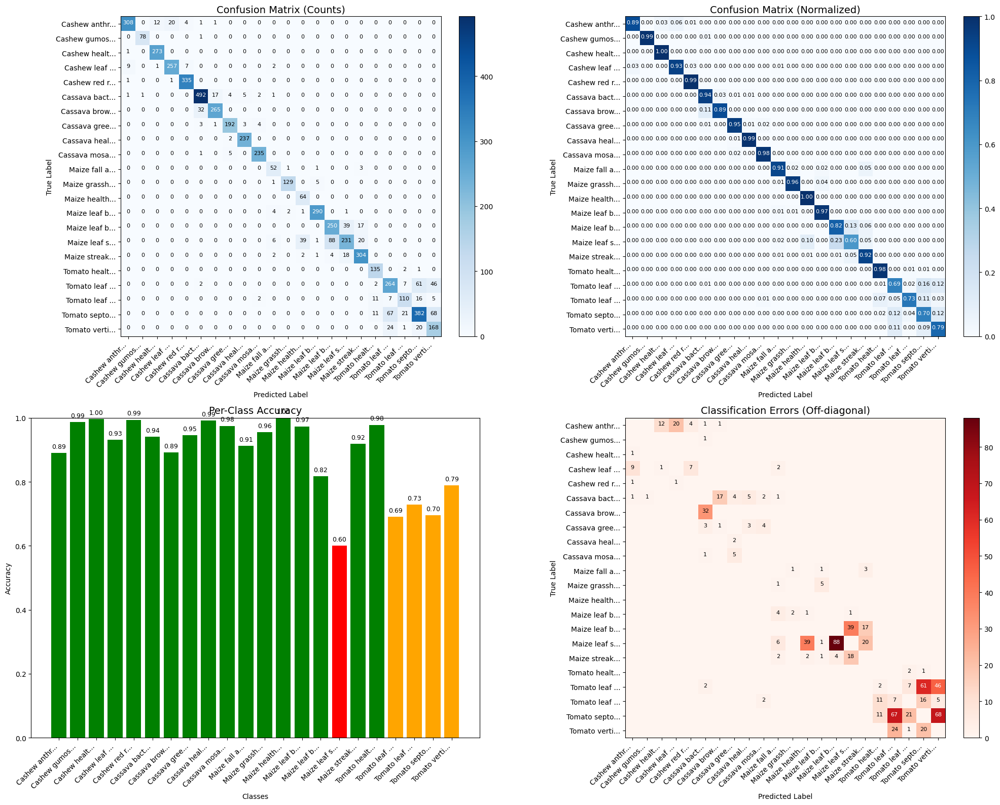


 CONFUSION MATRIX STATISTICS:
   Correct predictions: 5,051/5,824 (86.73%)
   Total misclassifications: 773
   Average per-class accuracy: 0.891
   Std per-class accuracy: 0.115

🔍 TOP 5 MOST CONFUSED CLASS PAIRS:
   Maize leaf spot → Maize leaf blight: 88 errors
   Tomato septoria leaf spot → Tomato verticulium wilt: 68 errors
   Tomato septoria leaf spot → Tomato leaf blight: 67 errors
   Tomato leaf blight → Tomato septoria leaf spot: 61 errors
   Tomato leaf blight → Tomato verticulium wilt: 46 errors
 Creating training curves visualization...


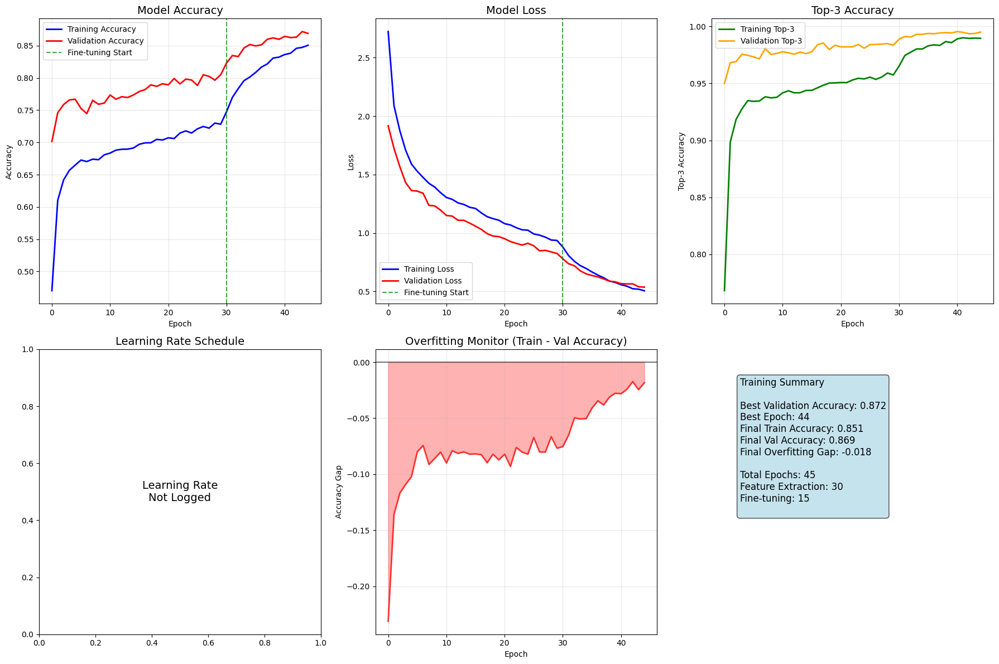

 Training curves saved to ./training_output
 Advanced visualizations completed successfully!


In [15]:
# Generate confusion matrix and advanced visualizations
def create_confusion_matrix_analysis(y_true, y_pred, class_names, save_dir):
    """
    Create comprehensive confusion matrix analysis
    
    Args:
        y_true: True labels
        y_pred: Predicted labels
        class_names: List of class names
        save_dir: Directory to save plots
    """
    print(" Creating confusion matrix analysis...")
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Create figure with subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    
    # 1. Standard confusion matrix
    im1 = ax1.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    ax1.set_title('Confusion Matrix (Counts)', fontsize=14)
    ax1.set_ylabel('True Label')
    ax1.set_xlabel('Predicted Label')
    
    # Add colorbar
    plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)
    
    # Set tick marks and labels
    tick_marks = np.arange(len(class_names))
    truncated_names = [name[:12] + '...' if len(name) > 12 else name for name in class_names]
    ax1.set_xticks(tick_marks)
    ax1.set_yticks(tick_marks)
    ax1.set_xticklabels(truncated_names, rotation=45, ha='right')
    ax1.set_yticklabels(truncated_names)
    
    # Add text annotations
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        ax1.text(j, i, format(cm[i, j], 'd'),
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black",
                fontsize=8)
    
    # 2. Normalized confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    im2 = ax2.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Blues)
    ax2.set_title('Confusion Matrix (Normalized)', fontsize=14)
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
    ax2.set_xticks(tick_marks)
    ax2.set_yticks(tick_marks)
    ax2.set_xticklabels(truncated_names, rotation=45, ha='right')
    ax2.set_yticklabels(truncated_names)
    
    # Add normalized values
    thresh_norm = cm_normalized.max() / 2.
    for i, j in itertools.product(range(cm_normalized.shape[0]), range(cm_normalized.shape[1])):
        ax2.text(j, i, format(cm_normalized[i, j], '.2f'),
                horizontalalignment="center",
                color="white" if cm_normalized[i, j] > thresh_norm else "black",
                fontsize=8)
    
    # 3. Per-class accuracy bar chart
    per_class_accuracy = cm.diagonal() / cm.sum(axis=1)
    bars = ax3.bar(range(len(class_names)), per_class_accuracy, 
                   color=['green' if acc > 0.8 else 'orange' if acc > 0.6 else 'red' for acc in per_class_accuracy])
    ax3.set_title('Per-Class Accuracy', fontsize=14)
    ax3.set_xlabel('Classes')
    ax3.set_ylabel('Accuracy')
    ax3.set_xticks(range(len(class_names)))
    ax3.set_xticklabels(truncated_names, rotation=45, ha='right')
    ax3.set_ylim(0, 1)
    
    # Add value labels on bars
    for bar, acc in zip(bars, per_class_accuracy):
        ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
                f'{acc:.2f}', ha='center', va='bottom', fontsize=9)
    
    # 4. Classification errors heatmap
    errors = cm.copy()
    np.fill_diagonal(errors, 0)  # Remove correct classifications
    im4 = ax4.imshow(errors, interpolation='nearest', cmap=plt.cm.Reds)
    ax4.set_title('Classification Errors (Off-diagonal)', fontsize=14)
    ax4.set_ylabel('True Label')
    ax4.set_xlabel('Predicted Label')
    
    plt.colorbar(im4, ax=ax4, fraction=0.046, pad=0.04)
    ax4.set_xticks(tick_marks)
    ax4.set_yticks(tick_marks)
    ax4.set_xticklabels(truncated_names, rotation=45, ha='right')
    ax4.set_yticklabels(truncated_names)
    
    # Add error counts
    thresh_err = errors.max() / 2.
    for i, j in itertools.product(range(errors.shape[0]), range(errors.shape[1])):
        if errors[i, j] > 0:
            ax4.text(j, i, format(errors[i, j], 'd'),
                    horizontalalignment="center",
                    color="white" if errors[i, j] > thresh_err else "black",
                    fontsize=8)
    
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'comprehensive_confusion_matrix.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print confusion matrix statistics
    print(f"\n CONFUSION MATRIX STATISTICS:")
    print(f"   Correct predictions: {np.trace(cm):,}/{cm.sum():,} ({np.trace(cm)/cm.sum()*100:.2f}%)")
    print(f"   Total misclassifications: {cm.sum() - np.trace(cm):,}")
    print(f"   Average per-class accuracy: {per_class_accuracy.mean():.3f}")
    print(f"   Std per-class accuracy: {per_class_accuracy.std():.3f}")
    
    # Find most confused pairs
    errors_flat = []
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            if i != j and errors[i, j] > 0:
                errors_flat.append((errors[i, j], i, j))
    
    errors_flat.sort(reverse=True)
    print(f"\n🔍 TOP 5 MOST CONFUSED CLASS PAIRS:")
    for count, true_idx, pred_idx in errors_flat[:5]:
        print(f"   {class_names[true_idx]} → {class_names[pred_idx]}: {count} errors")

def plot_training_curves(history_csv_path, save_dir):
    """
    Plot comprehensive training curves
    
    Args:
        history_csv_path: Path to training history CSV
        save_dir: Directory to save plots
    """
    print(" Creating training curves visualization...")
    
    if not os.path.exists(history_csv_path):
        print(f" Training history not found: {history_csv_path}")
        return
    
    # Load training history
    history_df = pd.read_csv(history_csv_path)
    
    # Create comprehensive training curves
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # 1. Accuracy
    axes[0, 0].plot(history_df['accuracy'], label='Training Accuracy', linewidth=2, color='blue')
    axes[0, 0].plot(history_df['val_accuracy'], label='Validation Accuracy', linewidth=2, color='red')
    axes[0, 0].set_title('Model Accuracy', fontsize=14)
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Accuracy')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Add vertical line for fine-tuning start (if applicable)
    if len(history_df) > EPOCHS:
        axes[0, 0].axvline(x=EPOCHS, color='green', linestyle='--', alpha=0.7, label='Fine-tuning Start')
        axes[0, 0].legend()
    
    # 2. Loss
    axes[0, 1].plot(history_df['loss'], label='Training Loss', linewidth=2, color='blue')
    axes[0, 1].plot(history_df['val_loss'], label='Validation Loss', linewidth=2, color='red')
    axes[0, 1].set_title('Model Loss', fontsize=14)
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    if len(history_df) > EPOCHS:
        axes[0, 1].axvline(x=EPOCHS, color='green', linestyle='--', alpha=0.7, label='Fine-tuning Start')
        axes[0, 1].legend()
    
    # 3. Top-3 Accuracy (if available)
    if 'top_3_accuracy' in history_df.columns:
        axes[0, 2].plot(history_df['top_3_accuracy'], label='Training Top-3', linewidth=2, color='green')
        axes[0, 2].plot(history_df['val_top_3_accuracy'], label='Validation Top-3', linewidth=2, color='orange')
        axes[0, 2].set_title('Top-3 Accuracy', fontsize=14)
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].set_ylabel('Top-3 Accuracy')
        axes[0, 2].legend()
        axes[0, 2].grid(True, alpha=0.3)
    else:
        axes[0, 2].text(0.5, 0.5, 'Top-3 Accuracy\nNot Available', ha='center', va='center',
                       transform=axes[0, 2].transAxes, fontsize=14)
        axes[0, 2].set_title('Top-3 Accuracy', fontsize=14)
    
    # 4. Learning Rate
    if 'lr' in history_df.columns:
        axes[1, 0].plot(history_df['lr'], linewidth=2, color='purple')
        axes[1, 0].set_title('Learning Rate Schedule', fontsize=14)
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Learning Rate')
        axes[1, 0].set_yscale('log')
        axes[1, 0].grid(True, alpha=0.3)
    else:
        axes[1, 0].text(0.5, 0.5, 'Learning Rate\nNot Logged', ha='center', va='center',
                       transform=axes[1, 0].transAxes, fontsize=14)
        axes[1, 0].set_title('Learning Rate Schedule', fontsize=14)
    
    # 5. Training vs Validation Gap
    acc_gap = history_df['accuracy'] - history_df['val_accuracy']
    axes[1, 1].plot(acc_gap, linewidth=2, color='red', alpha=0.7)
    axes[1, 1].axhline(y=0, color='black', linestyle='-', alpha=0.5)
    axes[1, 1].fill_between(range(len(acc_gap)), acc_gap, alpha=0.3, color='red')
    axes[1, 1].set_title('Overfitting Monitor (Train - Val Accuracy)', fontsize=14)
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Accuracy Gap')
    axes[1, 1].grid(True, alpha=0.3)
    
    # 6. Model Performance Summary
    axes[1, 2].axis('off')
    
    # Calculate summary statistics
    best_val_acc = history_df['val_accuracy'].max()
    best_epoch = history_df['val_accuracy'].idxmax() + 1
    final_train_acc = history_df['accuracy'].iloc[-1]
    final_val_acc = history_df['val_accuracy'].iloc[-1]
    final_gap = final_train_acc - final_val_acc
    
    summary_text = f"""Training Summary
    
Best Validation Accuracy: {best_val_acc:.3f}
Best Epoch: {best_epoch}
Final Train Accuracy: {final_train_acc:.3f}
Final Val Accuracy: {final_val_acc:.3f}
Final Overfitting Gap: {final_gap:.3f}

Total Epochs: {len(history_df)}
Feature Extraction: {EPOCHS}
Fine-tuning: {len(history_df) - EPOCHS if len(history_df) > EPOCHS else 0}
"""
    
    axes[1, 2].text(0.1, 0.9, summary_text, transform=axes[1, 2].transAxes,
                   fontsize=12, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))
    
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'comprehensive_training_curves.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f" Training curves saved to {save_dir}")

# Execute visualizations
create_confusion_matrix_analysis(y_true, y_pred, class_names, OUTPUT_DIR)
plot_training_curves(HISTORY_CSV, OUTPUT_DIR)

print(" Advanced visualizations completed successfully!")

## Model Interpretability and Error Analysis

 Performing model error analysis...
   Correct predictions: 5,051
   Incorrect predictions: 773

 Analyzing correct predictions...


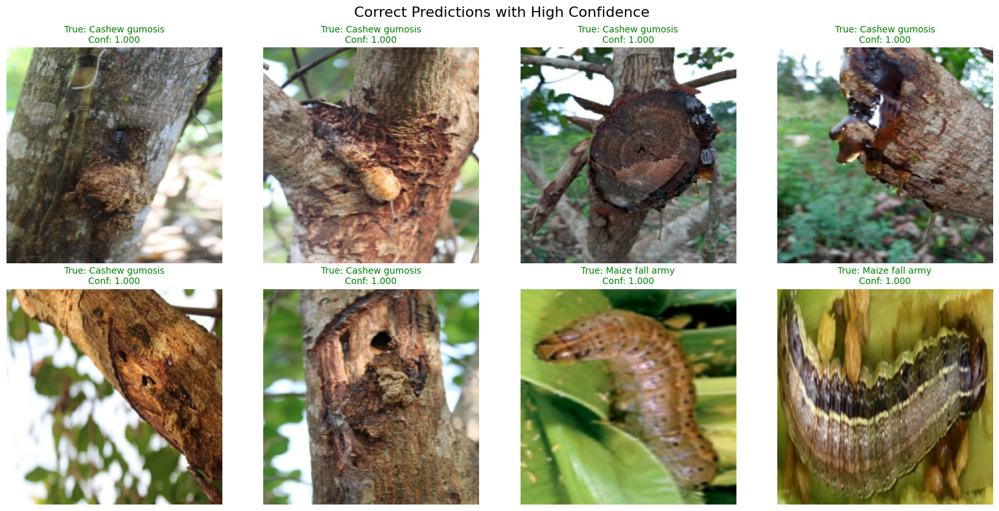


 Analyzing incorrect predictions...


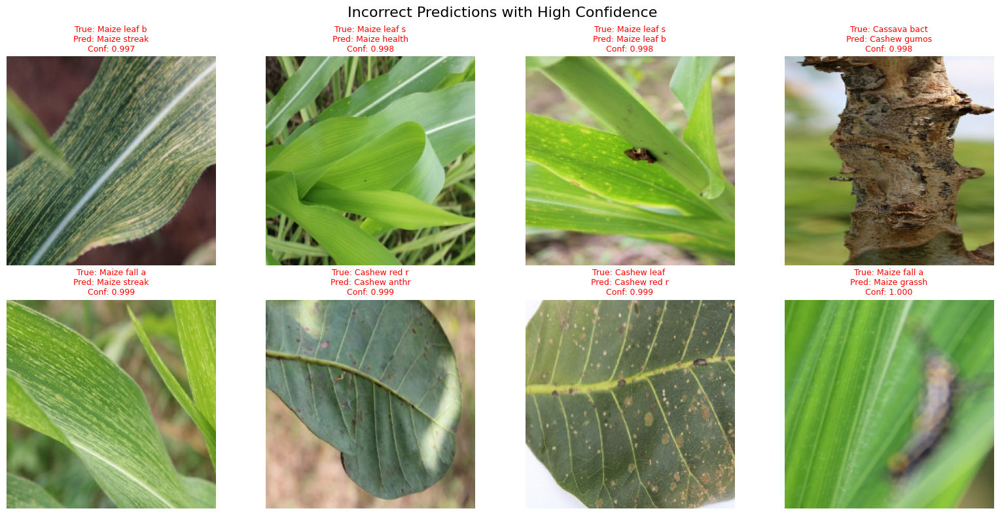

 Analyzing prediction confidence distribution...


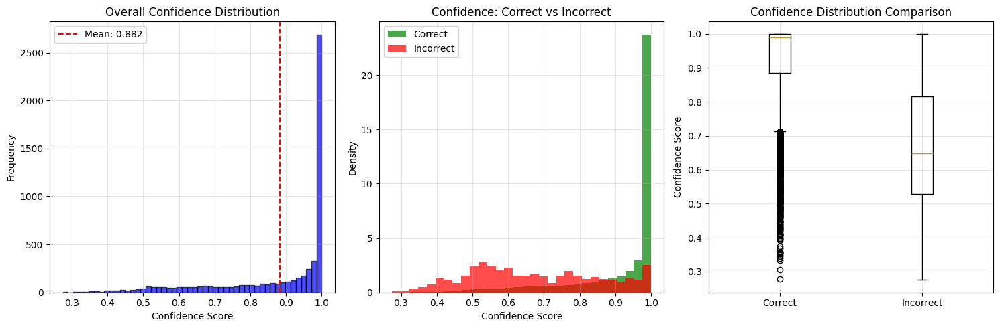


 CONFIDENCE STATISTICS:
   Overall mean confidence: 0.882
   Overall std confidence: 0.166
   Correct predictions mean confidence: 0.914
   Incorrect predictions mean confidence: 0.672
   Confidence gap (correct - incorrect): 0.242

 LOW CONFIDENCE PREDICTIONS (< 0.7):
   Count: 1,006 (17.3%)
   Accuracy on low confidence: 55.0%
 Creating prediction examples grid (4 samples per class)...


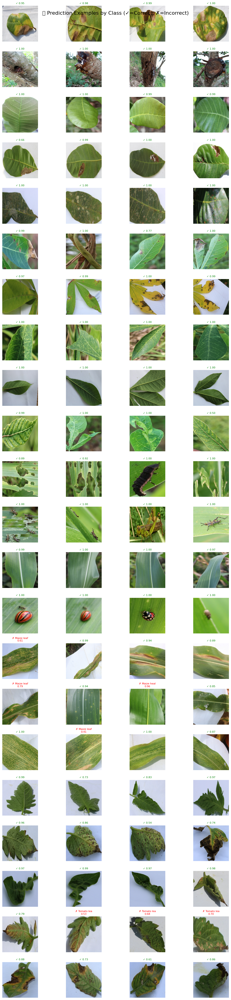

 Examples grid saved to ./training_output
 Model interpretability analysis completed!


In [16]:
# Model interpretability and error analysis
def analyze_model_errors(model, test_ds, class_names, y_true, y_pred, y_pred_probs, save_dir, num_examples=8):
    """
    Analyze model errors and show examples of correct/incorrect predictions
    
    Args:
        model: Trained model
        test_ds: Test dataset
        class_names: List of class names
        y_true: True labels
        y_pred: Predicted labels
        y_pred_probs: Prediction probabilities
        save_dir: Directory to save results
        num_examples: Number of examples to show
    """
    print(" Performing model error analysis...")
    
    # Create save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    # Ensure inputs are numpy arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_pred_probs = np.array(y_pred_probs)
    
    # Find correct and incorrect predictions
    correct_mask = (y_true == y_pred)
    incorrect_mask = ~correct_mask
    
    correct_indices = np.where(correct_mask)[0]
    incorrect_indices = np.where(incorrect_mask)[0]
    
    print(f"   Correct predictions: {correct_mask.sum():,}")
    print(f"   Incorrect predictions: {incorrect_mask.sum():,}")
    
    # Get test images for visualization
    test_images = []
    test_labels = []
    
    try:
        for batch_images, batch_labels in test_ds:
            test_images.extend(batch_images.numpy())
            test_labels.extend(batch_labels.numpy())
            
            # Limit collection to avoid memory issues
            if len(test_images) >= len(y_true):
                break
    except Exception as e:
        print(f"   Warning: Could not extract images from dataset: {e}")
        return
    
    test_images = np.array(test_images[:len(y_true)])
    test_labels = np.array(test_labels[:len(y_true)])
    
    # Show examples of correct predictions with high confidence
    if len(correct_indices) > 0:
        print("\n Analyzing correct predictions...")
        correct_confidences = y_pred_probs[correct_indices].max(axis=1)
        
        # Get high confidence correct predictions
        num_to_show = min(num_examples, len(correct_indices))
        high_conf_correct = correct_indices[np.argsort(correct_confidences)[-num_to_show:]]
        
        plt.figure(figsize=(16, 8))
        plt.suptitle(' Correct Predictions with High Confidence', fontsize=16)
        
        rows = 2
        cols = (num_to_show + 1) // 2
        
        for i, idx in enumerate(high_conf_correct):
            plt.subplot(rows, cols, i+1)
            
            # Normalize image for display
            img = test_images[idx]
            if img.max() <= 1.0:
                img = (img * 255).astype('uint8')
            else:
                img = img.astype('uint8')
                
            plt.imshow(img)
            
            true_class = class_names[y_true[idx]]
            confidence = y_pred_probs[idx].max()
            
            title = f'True: {true_class[:15]}\nConf: {confidence:.3f}'
            plt.title(title, fontsize=10, color='green')
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, 'correct_predictions_examples.png'), 
                    dpi=150, bbox_inches='tight')
        plt.show()
    
    # Show examples of incorrect predictions
    if len(incorrect_indices) > 0:
        print("\n Analyzing incorrect predictions...")
        incorrect_confidences = y_pred_probs[incorrect_indices].max(axis=1)
        
        # Get high confidence incorrect predictions
        num_to_show = min(num_examples, len(incorrect_indices))
        high_conf_incorrect = incorrect_indices[np.argsort(incorrect_confidences)[-num_to_show:]]
        
        plt.figure(figsize=(16, 8))
        plt.suptitle(' Incorrect Predictions with High Confidence', fontsize=16)
        
        rows = 2
        cols = (num_to_show + 1) // 2
        
        for i, idx in enumerate(high_conf_incorrect):
            plt.subplot(rows, cols, i+1)
            
            # Normalize image for display
            img = test_images[idx]
            if img.max() <= 1.0:
                img = (img * 255).astype('uint8')
            else:
                img = img.astype('uint8')
                
            plt.imshow(img)
            
            true_class = class_names[y_true[idx]]
            pred_class = class_names[y_pred[idx]]
            confidence = y_pred_probs[idx].max()
            
            title = f'True: {true_class[:12]}\nPred: {pred_class[:12]}\nConf: {confidence:.3f}'
            plt.title(title, fontsize=9, color='red')
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, 'incorrect_predictions_examples.png'), 
                    dpi=150, bbox_inches='tight')
        plt.show()
    
    # Confidence distribution analysis
    print(" Analyzing prediction confidence distribution...")
    
    plt.figure(figsize=(15, 5))
    
    # Overall confidence distribution
    plt.subplot(1, 3, 1)
    all_confidences = y_pred_probs.max(axis=1)
    plt.hist(all_confidences, bins=50, alpha=0.7, color='blue', edgecolor='black')
    plt.axvline(all_confidences.mean(), color='red', linestyle='--', 
                label=f'Mean: {all_confidences.mean():.3f}')
    plt.title('Overall Confidence Distribution')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Correct vs Incorrect confidence
    plt.subplot(1, 3, 2)
    if len(correct_indices) > 0:
        correct_conf = y_pred_probs[correct_indices].max(axis=1)
        plt.hist(correct_conf, bins=30, alpha=0.7, color='green', 
                label='Correct', density=True)
    
    if len(incorrect_indices) > 0:
        incorrect_conf = y_pred_probs[incorrect_indices].max(axis=1)
        plt.hist(incorrect_conf, bins=30, alpha=0.7, color='red', 
                label='Incorrect', density=True)
    
    plt.title('Confidence: Correct vs Incorrect')
    plt.xlabel('Confidence Score')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Box plot comparison
    plt.subplot(1, 3, 3)
    conf_data = []
    labels = []
    
    if len(correct_indices) > 0:
        correct_conf = y_pred_probs[correct_indices].max(axis=1)
        conf_data.append(correct_conf)
        labels.append('Correct')
    
    if len(incorrect_indices) > 0:
        incorrect_conf = y_pred_probs[incorrect_indices].max(axis=1)
        conf_data.append(incorrect_conf)
        labels.append('Incorrect')
    
    if conf_data:
        plt.boxplot(conf_data, labels=labels)
        plt.title('Confidence Distribution Comparison')
        plt.ylabel('Confidence Score')
        plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'confidence_analysis.png'), 
                dpi=150, bbox_inches='tight')
    plt.show()
    
    # Print confidence statistics
    print(f"\n CONFIDENCE STATISTICS:")
    print(f"   Overall mean confidence: {all_confidences.mean():.3f}")
    print(f"   Overall std confidence: {all_confidences.std():.3f}")
    
    if len(correct_indices) > 0:
        correct_conf = y_pred_probs[correct_indices].max(axis=1)
        print(f"   Correct predictions mean confidence: {correct_conf.mean():.3f}")
    
    if len(incorrect_indices) > 0:
        incorrect_conf = y_pred_probs[incorrect_indices].max(axis=1)
        print(f"   Incorrect predictions mean confidence: {incorrect_conf.mean():.3f}")
        if len(correct_indices) > 0:
            print(f"   Confidence gap (correct - incorrect): {correct_conf.mean() - incorrect_conf.mean():.3f}")
    
    # Low confidence predictions (potential issues)
    low_conf_threshold = 0.7
    low_conf_mask = all_confidences < low_conf_threshold
    low_conf_count = low_conf_mask.sum()
    
    print(f"\n LOW CONFIDENCE PREDICTIONS (< {low_conf_threshold}):")
    print(f"   Count: {low_conf_count:,} ({low_conf_count/len(all_confidences)*100:.1f}%)")
    
    if low_conf_count > 0:
        low_conf_indices = np.where(low_conf_mask)[0]
        low_conf_accuracy = (y_true[low_conf_indices] == y_pred[low_conf_indices]).mean()
        print(f"   Accuracy on low confidence: {low_conf_accuracy*100:.1f}%")

def create_prediction_examples_grid(model, test_ds, class_names, save_dir, samples_per_class=3):
    """
    Create a grid showing prediction examples for each class
    
    Args:
        model: Trained model
        test_ds: Test dataset
        class_names: List of class names
        save_dir: Directory to save results
        samples_per_class: Number of examples per class
    """
    print(f" Creating prediction examples grid ({samples_per_class} samples per class)...")
    
    # Create save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    # Collect examples for each class
    class_examples = {i: [] for i in range(len(class_names))}
    class_predictions = {i: [] for i in range(len(class_names))}
    
    # Process test dataset
    try:
        for images, labels in test_ds:
            if all(len(examples) >= samples_per_class for examples in class_examples.values()):
                break
                
            predictions = model.predict(images, verbose=0)
            
            for img, label, pred in zip(images.numpy(), labels.numpy(), predictions):
                label_idx = int(label)
                if label_idx < len(class_names) and len(class_examples[label_idx]) < samples_per_class:
                    class_examples[label_idx].append(img)
                    class_predictions[label_idx].append(pred)
    except Exception as e:
        print(f"   Error processing dataset: {e}")
        return
    
    # Create the grid
    fig, axes = plt.subplots(len(class_names), samples_per_class, 
                           figsize=(samples_per_class * 3, len(class_names) * 2))
    
    # Handle single row or column cases
    if len(class_names) == 1:
        axes = axes.reshape(1, -1)
    elif samples_per_class == 1:
        axes = axes.reshape(-1, 1)
    elif len(class_names) == 1 and samples_per_class == 1:
        axes = np.array([[axes]])
    
    for class_idx, class_name in enumerate(class_names):
        for sample_idx in range(samples_per_class):
            if len(class_names) == 1 and samples_per_class == 1:
                ax = axes[0, 0]
            elif len(class_names) == 1:
                ax = axes[0, sample_idx]
            elif samples_per_class == 1:
                ax = axes[class_idx, 0]
            else:
                ax = axes[class_idx, sample_idx]
            
            if sample_idx < len(class_examples[class_idx]):
                # Show image
                img = class_examples[class_idx][sample_idx]
                
                # Normalize image for display
                if img.max() <= 1.0:
                    img = (img * 255).astype('uint8')
                else:
                    img = img.astype('uint8')
                
                ax.imshow(img)
                
                # Get prediction
                pred_probs = class_predictions[class_idx][sample_idx]
                pred_class = np.argmax(pred_probs)
                confidence = pred_probs.max()
                
                # Set title based on correctness
                if pred_class == class_idx:
                    title_color = 'green'
                    title = f'Correct {confidence:.2f}'
                else:
                    title_color = 'red'
                    wrong_class = class_names[pred_class] if pred_class < len(class_names) else 'Unknown'
                    title = f'Wrong: {wrong_class[:10]}\n{confidence:.2f}'
                
                ax.set_title(title, color=title_color, fontsize=8)
            else:
                ax.text(0.5, 0.5, 'No sample\navailable', ha='center', va='center',
                       transform=ax.transAxes)
            
            ax.axis('off')
            
            # Add class name on the left
            if sample_idx == 0:
                display_name = class_name if len(class_name) <= 20 else class_name[:17] + "..."
                ax.set_ylabel(display_name, rotation=90, ha='right', va='center', fontsize=10)
    
    plt.suptitle('Prediction Examples by Class (Green=Correct, Red=Incorrect)', fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'prediction_examples_grid.png'), 
                dpi=200, bbox_inches='tight')
    plt.show()
    
    print(f" Examples grid saved to {save_dir}")

# Execute error analysis and interpretability
analyze_model_errors(model, test_ds, class_names, y_true, y_pred, y_pred_probs, OUTPUT_DIR)
create_prediction_examples_grid(model, test_ds, class_names, OUTPUT_DIR, samples_per_class=4)

print(" Model interpretability analysis completed!")

## Save Model and Create Deployment Package

In [22]:
# Save final model in multiple formats - Keras 3 Compatible
def save_model_comprehensive(model, save_dir, model_name="plant_disease_classifier"):
    """
    Save model in multiple formats compatible with Keras 3
    
    Args:
        model: Trained Keras model
        save_dir: Directory to save model and artifacts
        model_name: Base name for saved files
    
    Returns:
        Dictionary with save paths
    """
    print(" Saving model in multiple formats...")
    
    # Create save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)
    
    save_paths = {}
    
    # 1. Save using model.export() for SavedModel (TFLite/TFServing compatible)
    try:
        savedmodel_path = os.path.join(save_dir, f"{model_name}_savedmodel")
        model.export(savedmodel_path)  # Use export() instead of save() for SavedModel
        save_paths['savedmodel'] = savedmodel_path
        print(f"   SavedModel format: {savedmodel_path}")
    except Exception as e:
        print(f"   Failed to save SavedModel: {e}")
    
    # 2. Save in native Keras format (.keras)
    try:
        keras_path = os.path.join(save_dir, f"{model_name}.keras")
        model.save(keras_path)
        save_paths['keras'] = keras_path
        print(f"   Native Keras format: {keras_path}")
    except Exception as e:
        print(f"   Failed to save Keras format: {e}")
    
    # 3. Save in H5 format - FIXED for custom metrics
    try:
        h5_path = os.path.join(save_dir, f"{model_name}.h5")
        # Suppress the legacy format warning and save without custom objects
        import warnings
        with warnings.catch_warnings():
            warnings.filterwarnings('ignore', message='.*HDF5.*')
            # Save with include_optimizer=False to avoid custom metric issues
            model.save(h5_path, include_optimizer=False)
        save_paths['h5'] = h5_path
        print(f"   H5 format: {h5_path}")
    except Exception as e:
        print(f"   Failed to save H5: {e}")
        # Try alternative method
        try:
            print("   Attempting H5 save without custom objects...")
            # Create a copy without custom metrics for H5 saving
            model_copy = tf.keras.models.clone_model(model)
            model_copy.set_weights(model.get_weights())
            model_copy.compile(
                optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy']  # Use standard metrics only
            )
            with warnings.catch_warnings():
                warnings.filterwarnings('ignore', message='.*HDF5.*')
                model_copy.save(h5_path, include_optimizer=False)
            save_paths['h5'] = h5_path
            print(f"   H5 format (simplified): {h5_path}")
        except Exception as e2:
            print(f"   H5 save failed completely: {e2}")
    
    # 4. Save weights only - FIXED filename
    try:
        weights_path = os.path.join(save_dir, f"{model_name}.weights.h5")
        model.save_weights(weights_path)
        save_paths['weights'] = weights_path
        print(f"   Weights H5: {weights_path}")
    except Exception as e:
        print(f"   Failed to save weights: {e}")
    
    # 5. Save weights in TensorFlow format
    try:
        weights_tf_path = os.path.join(save_dir, f"{model_name}_weights_tf")
        # For TF format, don't add extension, let TF handle it
        model.save_weights(weights_tf_path, save_format='tf')
        save_paths['weights_tf'] = weights_tf_path
        print(f"   Weights TF format: {weights_tf_path}")
    except Exception as e:
        print(f"   Failed to save TF weights: {e}")
    
    # 6. Save model architecture as JSON
    try:
        architecture_path = os.path.join(save_dir, f"{model_name}_architecture.json")
        with open(architecture_path, 'w', encoding='utf-8') as f:
            f.write(model.to_json())
        save_paths['architecture'] = architecture_path
        print(f"   Architecture JSON: {architecture_path}")
    except Exception as e:
        print(f"   Failed to save architecture: {e}")
    
    # 7. Save model summary as text file - FIXED encoding
    try:
        summary_path = os.path.join(save_dir, f"{model_name}_summary.txt")
        with open(summary_path, 'w', encoding='utf-8') as f:
            model.summary(print_fn=lambda x: f.write(x + '\n'))
        save_paths['summary'] = summary_path
        print(f"   Model summary: {summary_path}")
    except Exception as e:
        print(f"   Failed to save summary: {e}")
    
    # 8. Save class names as JSON
    try:
        classes_path = os.path.join(save_dir, f"{model_name}_classes.json")
        classes_dict = {str(i): class_name for i, class_name in enumerate(class_names)}
        with open(classes_path, 'w', encoding='utf-8') as f:
            json.dump(classes_dict, f, indent=2, ensure_ascii=False)
        save_paths['classes'] = classes_path
        print(f"   Class names: {classes_path}")
    except Exception as e:
        print(f"   Failed to save class names: {e}")
    
    # 9. Save model configuration - FIXED JSON serialization
    try:
        config_path = os.path.join(save_dir, f"{model_name}_config.json")
        config = {
            'model_name': model_name,
            'input_shape': list(model.input_shape[1:]) if hasattr(model, 'input_shape') else None,
            'output_shape': list(model.output_shape[1:]) if hasattr(model, 'output_shape') else None,
            'num_classes': len(class_names),
            'total_parameters': int(model.count_params()),  # Convert to int
            'trainable_parameters': int(sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])),
            'non_trainable_parameters': int(sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])),
            'save_timestamp': datetime.now().isoformat(),
            'keras_version': tf.keras.__version__,
            'tensorflow_version': tf.__version__
        }
        with open(config_path, 'w', encoding='utf-8') as f:
            json.dump(config, f, indent=2, ensure_ascii=False)
        save_paths['config'] = config_path
        print(f"   Model config: {config_path}")
    except Exception as e:
        print(f"   Failed to save config: {e}")
    
    print(f" Model saved successfully in {len(save_paths)} formats")
    print(f"   Total model size: {get_directory_size(save_dir):.1f} MB")
    
    return save_paths

def get_directory_size(directory):
    """Calculate total size of directory in MB"""
    total_size = 0
    try:
        for dirpath, dirnames, filenames in os.walk(directory):
            for filename in filenames:
                filepath = os.path.join(dirpath, filename)
                total_size += os.path.getsize(filepath)
        return total_size / (1024 * 1024)  # Convert to MB
    except Exception:
        return 0

def verify_saved_models(save_paths, model_name):
    """
    Verify that saved models can be loaded correctly
    
    Args:
        save_paths: Dictionary of save paths from save_model_comprehensive
        model_name: Name of the model
    """
    print(" Verifying saved models...")
    
    verification_results = {}
    
    # Test SavedModel loading (exported model)
    if 'savedmodel' in save_paths:
        try:
            loaded_model = tf.saved_model.load(save_paths['savedmodel'])
            verification_results['savedmodel'] = {
                'status': 'success',
                'type': 'SavedModel (exported)',
                'note': 'Loaded as TF SavedModel'
            }
            print(f"   SavedModel: Loading successful")
        except Exception as e:
            verification_results['savedmodel'] = {'status': 'failed', 'error': str(e)}
            print(f"   SavedModel: Loading failed - {e}")
    
    # Test native Keras format loading
    if 'keras' in save_paths:
        try:
            # For models with custom metrics, load without compiling
            loaded_model = tf.keras.models.load_model(save_paths['keras'], compile=False)
            verification_results['keras'] = {
                'status': 'success',
                'input_shape': loaded_model.input_shape,
                'output_shape': loaded_model.output_shape,
                'parameters': loaded_model.count_params()
            }
            print(f"   Native Keras: Loading successful")
        except Exception as e:
            verification_results['keras'] = {'status': 'failed', 'error': str(e)}
            print(f"   Native Keras: Loading failed - {e}")
    
    # Test H5 loading
    if 'h5' in save_paths:
        try:
            loaded_model = tf.keras.models.load_model(save_paths['h5'], compile=False)
            verification_results['h5'] = {
                'status': 'success',
                'input_shape': loaded_model.input_shape,
                'output_shape': loaded_model.output_shape,
                'parameters': loaded_model.count_params()
            }
            print(f"   H5 format: Loading successful")
        except Exception as e:
            verification_results['h5'] = {'status': 'failed', 'error': str(e)}
            print(f"   H5 format: Loading failed - {e}")
    
    # Test weights loading (requires architecture)
    if 'weights' in save_paths and 'architecture' in save_paths:
        try:
            # Load architecture
            with open(save_paths['architecture'], 'r', encoding='utf-8') as f:
                architecture = f.read()
            
            # Recreate model and load weights
            loaded_model = tf.keras.models.model_from_json(architecture)
            loaded_model.load_weights(save_paths['weights'])
            
            verification_results['weights'] = {
                'status': 'success',
                'input_shape': loaded_model.input_shape,
                'output_shape': loaded_model.output_shape,
                'parameters': loaded_model.count_params()
            }
            print(f"   Weights + Architecture: Loading successful")
        except Exception as e:
            verification_results['weights'] = {'status': 'failed', 'error': str(e)}
            print(f"   Weights + Architecture: Loading failed - {e}")
    
    # Verify JSON files
    json_files = ['classes', 'config']
    for file_type in json_files:
        if file_type in save_paths:
            try:
                with open(save_paths[file_type], 'r', encoding='utf-8') as f:
                    data = json.load(f)
                verification_results[file_type] = {'status': 'success', 'keys': list(data.keys())}
                print(f"   {file_type.title()} JSON: Valid")
            except Exception as e:
                verification_results[file_type] = {'status': 'failed', 'error': str(e)}
                print(f"   {file_type.title()} JSON: Invalid - {e}")
    
    # Save verification results
    verification_path = os.path.join(os.path.dirname(list(save_paths.values())[0]), 
                                   f"{model_name}_verification.json")
    try:
        with open(verification_path, 'w', encoding='utf-8') as f:
            json.dump(verification_results, f, indent=2, default=str, ensure_ascii=False)
        print(f"   Verification report: {verification_path}")
    except Exception as e:
        print(f"   Failed to save verification report: {e}")
    
    return verification_results

# Execute model saving
saved_paths = save_model_comprehensive(model, OUTPUT_DIR)
verification_results = verify_saved_models(saved_paths, "plant_disease_classifier")

print(" Model saving and verification completed!")

 Saving model in multiple formats...


2025-08-12 20:00:44,228 - INFO - Function `__call__` contains input name(s) resource with unsupported characters which will be renamed to efficientnetv2_s_plantdisease_1_predictions_1_biasadd_readvariableop_resource in the SavedModel.
2025-08-12 20:00:44,475 - INFO - Function `__call__` contains input name(s) resource with unsupported characters which will be renamed to efficientnetv2_s_plantdisease_1_predictions_1_biasadd_readvariableop_resource in the SavedModel.


INFO:tensorflow:Assets written to: ./training_output\plant_disease_classifier_savedmodel\assets


2025-08-12 20:00:55,635 - INFO - Assets written to: ./training_output\plant_disease_classifier_savedmodel\assets


Saved artifact at './training_output\plant_disease_classifier_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_521')
Output Type:
  TensorSpec(shape=(None, 22), dtype=tf.float32, name=None)
Captures:
  2242131955552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242131957488: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242113977888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242113963104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242113975072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242113976304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242132881856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242132884848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242132883440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2242132876400: TensorSpec(shape=(), dtype=tf.resource, name=

2025-08-12 20:00:57,470 - WARNING - You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`. 


   Native Keras format: ./training_output\plant_disease_classifier.keras
   Failed to save H5: cannot pickle 'module' object
   Attempting H5 save without custom objects...
   H5 save failed completely: Could not locate function 'top_3_accuracy'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'module': 'builtins', 'class_name': 'function', 'config': 'top_3_accuracy', 'registered_name': 'function'}
   Weights H5: ./training_output\plant_disease_classifier.weights.h5
   Failed to save TF weights: Model.save_weights() got an unexpected keyword argument 'save_format'
   Architecture JSON: ./training_output\plant_disease_classifier_architecture.json


   Model summary: ./training_output\plant_disease_classifier_summary.txt
   Class names: ./training_output\plant_disease_classifier_classes.json
   Model config: ./training_output\plant_disease_classifier_config.json
 Model saved successfully in 7 formats
   Total model size: 1455.6 MB
 Verifying saved models...
   SavedModel: Loading successful
   Native Keras: Loading successful
   Weights + Architecture: Loading failed - Could not locate function 'top_3_accuracy'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'module': 'builtins', 'class_name': 'function', 'config': 'top_3_accuracy', 'registered_name': 'function'}
   Classes JSON: Valid
   Config JSON: Valid
   Verification report: ./training_output\plant_disease_classifier_verification.json
 Model saving and verification completed!


plant-disease-classifier/
├── 📄 README.md                          # This file
├── 🤖 plant_disease_classifier.h5        # Trained model (H5 format)
├── 🤖 plant_disease_classifier_savedmodel/   # Trained model (SavedModel format)
├── 📊 categories.json                    # Class labels mapping
├── 🐍 deploy_model.py                    # Main deployment script
├── 🐍 api_server.py                      # Flask API server
├── 🐳 Dockerfile                         # Docker container setup
├── 📦 requirements.txt                   # Python dependencies
├── 📈 evaluation_results.json            # Detailed evaluation metrics
├── 📋 detailed_classification_report.csv # Per-class performance
├── 🖼️ visualizations/                    # Training curves and analysis plots
│   ├── comprehensive_confusion_matrix.png
│   ├── comprehensive_training_curves.png
│   ├── confidence_analysis.png
│   └── prediction_examples_grid.png
└── 📚 docs/                              # Additional documentation